In [1]:
import matplotlib.pyplot as plt

import numpy as np

from astropy import constants as cst
from astropy import units as u
import healpy as hp

from aqn import *
from constants import *

Loaded constants script
Loaded AQN script


In [2]:
# define AQN parameters
m_aqn_kg = 0.030726*u.kg
R_aqn_cm = calc_R_AQN(m_aqn_kg)

print("using m_aqn =", m_aqn_kg)
print("using R_aqn =", R_aqn_cm)

using m_aqn = 0.030726 kg
using R_aqn = 2.7570826853066117e-05 cm


In [3]:
# define bandwidth

################ GALEX #########################################
wavel_min = 1350 * u.Angstrom
wavel_max = 1750 * u.Angstrom
f_max_hz = (cst.c.cgs / wavel_min.to(u.cm)).to(u.Hz)
f_min_hz = (cst.c.cgs / wavel_max.to(u.cm)).to(u.Hz)

print("wavelength range:", wavel_min, "---", wavel_max)
print("frequency  range:", f_min_hz, "---", f_max_hz)

skymap_units =  1*u.photon / u.cm**2 / u.s / u.Angstrom
# conversion array from erg/s/Hz/cm2 to photons/s/A/cm2
def convert_to_skymap_units(F_erg_hz_cm2,nu):
    erg_hz_cm2 = 1*u.erg/u.s/u.Hz/u.cm**2
    w = nu.to(u.AA, equivalencies=u.spectral())
    C = (erg_hz_cm2).to(skymap_units, u.spectral_density(w)) / erg_hz_cm2 * 2*np.pi
    #                                                                      ^^^^^^^ this comes from using hbar instead of h in the conversion.
    return F_erg_hz_cm2 * C
#################################################################

wavelength range: 1350.0 Angstrom --- 1750.0 Angstrom
frequency  range: 1713099759999999.8 Hz --- 2220684874074073.5 Hz


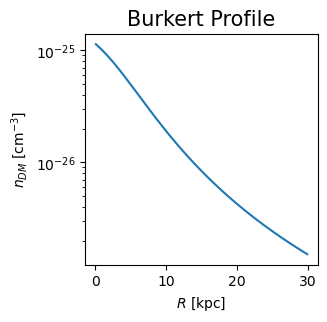

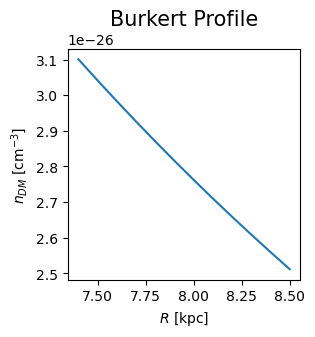

In [4]:
sun_mw_distance_kpc = 8*u.kpc

# DM Halo Model

# ########### NFW Profile #############################################
# dm_model_name = "NFW Profile"
# rho_0h = 0.0106 * u.solMass / u.pc**3
# r_h = 19.0 * u.kpc

# def rho_halo(R_kpc):
#     return rho_0h.to(u.kg/u.m**3) / ((R_kpc/r_h)*(1+R_kpc/r_h)**2)

# def n_halo(R_none):
#     return (rho_halo(R_none*u.kpc) / m_aqn_kg).to(1/u.cm**3)
# #####################################################################

# # ########### constant density #########################################
# dm_model_name = "Constant DM density"
# n_aqn_const_cm3 = 0.3/1e25 * u.cm**-3
# def n_halo(R_none):
#     return np.ones(np.shape(R_none)) * n_aqn_const_cm3
# # ######################################################################

########### Burkert Profile #########################################
dm_model_name = "Burkert Profile"
vh = 414 * u.km / u.s
r0 = 7.8 * u.kpc
rho0 = (vh**2 / (4*np.pi * r0**2 * cst.G)).to(u.kg/u.m**3)

def rho_halo(R_kpc):
    return rho0 * r0**3 / ( (R_kpc+r0)*((R_kpc)**2 + r0**2) )

def n_halo(R_none):
    return (rho_halo(R_none*u.kpc) / m_aqn_kg).to(1/u.cm**3)
#####################################################################

plt.figure(dpi=100,figsize=(3,3))
plt.plot(np.arange(0.1,30,0.1), n_halo(np.arange(0.1,30,0.1)))
plt.xlabel("$R$ [kpc]")
plt.ylabel("$n_{DM}$ [cm$^{-3}$]")
plt.yscale("log")
plt.title(dm_model_name, size=15)
#plt.savefig(dm_model_name+".png", bbox_inches='tight')
plt.show()

plt.figure(dpi=100,figsize=(3,3))
plot_range = np.arange(8-0.6,8+0.6,0.1)
plt.plot(plot_range, n_halo(plot_range))
plt.xlabel("$R$ [kpc]")
plt.ylabel("$n_{DM}$ [cm$^{-3}$]")
#plt.yscale("log")
plt.title(dm_model_name, size=15)
#plt.savefig(dm_model_name+".png", bbox_inches='tight')
plt.show()

In [5]:
# #n_halo_burkert = n_halo(np.arange(0.1,30,0.1))
# #n_halo_nfw = n_halo(np.arange(0.1,30,0.1))

# plt.figure(dpi=100,figsize=(3,3))
# plt.plot(np.arange(0.1,30,0.1), n_halo(np.arange(0.1,30,0.1)), label="Constant Density")
# plt.plot(np.arange(0.1,30,0.1), n_halo_nfw, label="NFW Profile")
# plt.plot(np.arange(0.1,30,0.1), n_halo_burkert, label = "Burkert Profile")
# plt.xlabel("$R$ [kpc]")
# plt.ylabel("$n_{DM}$ [cm$^{-3}$]")
# plt.yscale("log")
# plt.title("Comparing DM Models", size=14)
# plt.legend(fontsize=10)
# #plt.savefig("Comparing DM Models with Constant DM"+".png", bbox_inches='tight')
# plt.show()

In [6]:
# #n_halo_constant = n_halo(np.arange(8-0.6,8+0.6,0.1))
# #n_halo_burkert = n_halo(np.arange(8-0.6,8+0.6,0.1))
# #n_halo_nfw = n_halo(np.arange(8-0.6,8+0.6,0.1))

# plt.figure(dpi=100,figsize=(3,3))
# #plt.plot(np.arange(8-0.6,8+0.6,0.1), n_halo_constant, label="Constant Density")
# plt.plot(np.arange(8-0.6,8+0.6,0.1), n_halo_nfw, label="NFW Profile")
# plt.plot(np.arange(8-0.6,8+0.6,0.1), n_halo_burkert, label = "Burkert Profile")
# plt.xlabel("$R$ [kpc]")
# plt.ylabel("$n_{DM}$ [cm$^{-3}$]")
# #plt.yscale("log")
# plt.title("Comparing DM Models", size=14)
# plt.legend(fontsize=10)
# #plt.savefig("Comparing DM Models with Constant DM close to sun"+".png", bbox_inches='tight')
# plt.show()

In [7]:
# VM Model
n_cold_cm3 = 1.0e-1 * u.cm**-3

def n_gas(R_none):
    return np.ones(np.shape(R_none)) * n_cold_cm3

print("using constant VM model")

using constant VM model


In [8]:
# some resolution parameters
NSIDE = 2**6
wavelength_band_resolution = 30
frequency_band_resolution = 0.5e14
dl = 0.05 * u.kpc
NPIX = hp.nside2npix(NSIDE)
dOmega = hp.nside2pixarea(nside=NSIDE)
remove_low_lat = False

# array of theta, phi, for each pixel
theta, phi = hp.pix2ang(nside = NSIDE, ipix = list(range(NPIX)))
low_lat_filter = (np.degrees(theta) > 73) & (np.degrees(theta) < 113)
high_lat_filter = (np.degrees(theta) < 73) | (np.degrees(theta) > 113)

# frequency band
frequency_band = np.arange(f_min_hz.value, f_max_hz.value, frequency_band_resolution) * u.Hz

print("using NSIDE of:", NSIDE)
print("     dOmega is:", dOmega)

using NSIDE of: 64
     dOmega is: 0.00025566346464760684


In [9]:
# sightline elements
l_min_kpc = 0.0*u.kpc
l_max_kpc = 0.6*u.kpc
l_list = np.arange(l_min_kpc.value,l_max_kpc.value,dl.value)[:, np.newaxis]

# 2D array of distance elements along each sightline, sun-centric
l_array = np.ones((len(l_list),len(theta))) * l_list
if remove_low_lat:             # number of pixels
    l_array[:,low_lat_filter] = 0

# 2D array of distance elements along each sightline, galaxy-centric
x = l_array * np.sin(theta) * np.cos(phi) - sun_mw_distance_kpc.value
y = l_array * np.sin(theta) * np.sin(phi)
z = l_array * np.cos(theta)
R_array = np.sqrt(x**2 + y**2 + z**2)

In [10]:
# calculate VM number density
n_gas_cm3 = n_gas(R_array) 
n_gas_cm3

<Quantity [[0.1, 0.1, 0.1, ..., 0.1, 0.1, 0.1],
           [0.1, 0.1, 0.1, ..., 0.1, 0.1, 0.1],
           [0.1, 0.1, 0.1, ..., 0.1, 0.1, 0.1],
           ...,
           [0.1, 0.1, 0.1, ..., 0.1, 0.1, 0.1],
           [0.1, 0.1, 0.1, ..., 0.1, 0.1, 0.1],
           [0.1, 0.1, 0.1, ..., 0.1, 0.1, 0.1]] 1 / cm3>

In [11]:
# calculate AQN number density
n_aqn_cm3 = n_halo(R_array)

In [12]:
print(np.min(n_aqn_cm3), np.max(n_aqn_cm3))

2.4879331833313773e-26 1 / cm3 3.070871545742633e-26 1 / cm3


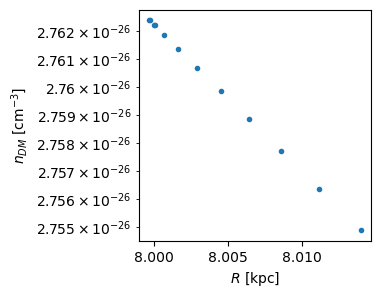

In [13]:
plt.figure(dpi=100,figsize=(3,3))
plot_range = np.arange(8-0.6,8+0.6,0.1)
plt.plot(R_array[:,0], n_halo(R_array[:,0]), ".")
plt.xlabel("$R$ [kpc]")
plt.ylabel("$n_{DM}$ [cm$^{-3}$]")
plt.yscale("log")

plt.show()

In [14]:
# calculate AQN temperature
def T_AQN_neutral(n_bar, Dv, f, g):
    return (3/32 * np.pi * (1-g) * f * Dv * 1/(cst.alpha**(5/2)) * m_p_erg * (m_e_erg)**(1/4) * 
            ((n_bar).to(1/u.cm**3) * invcm_to_erg**3))**(4/17) * erg_to_eV

T_aqn_ev = T_AQN_neutral(n_gas_cm3, Dv, f, g)

In [15]:
T_aqn_ev

<Quantity [[0.11767727, 0.11767727, 0.11767727, ..., 0.11767727,
            0.11767727, 0.11767727],
           [0.11767727, 0.11767727, 0.11767727, ..., 0.11767727,
            0.11767727, 0.11767727],
           [0.11767727, 0.11767727, 0.11767727, ..., 0.11767727,
            0.11767727, 0.11767727],
           ...,
           [0.11767727, 0.11767727, 0.11767727, ..., 0.11767727,
            0.11767727, 0.11767727],
           [0.11767727, 0.11767727, 0.11767727, ..., 0.11767727,
            0.11767727, 0.11767727],
           [0.11767727, 0.11767727, 0.11767727, ..., 0.11767727,
            0.11767727, 0.11767727]] eV>

In [16]:
#T_aqn_ev = T_aqn_ev/0.1176 * 5

In [17]:
h_func_cutoff = 17 + 12*np.log(2)
def h(x):
    return_array = np.copy(x)
    return_array[np.where(x<1)] = (17 - 12*np.log(x[np.where(x<1)]/2))
    return_array[np.where(x>=1)] = h_func_cutoff
    return return_array

# erg Hz^-1 s^-1 cm^-2
# nu Hz
# T eV
def spectral_surface_emissivity_cgs(nu, T):
    T_K = T * eV_to_K
    k_B_cgs = cst.k_B.cgs
    h_cgs = cst.h.cgs

    return  (1/u.Hz)*(1/cst.hbar.cgs * 1/cst.c.cgs)**2 * 4/45 * (k_B_cgs * T_K)**3 * cst.alpha ** (5/2) * 1/np.pi * ((k_B_cgs * T_K)/(m_e_eV*eV_to_erg))**(1/4) * (1 + (h_cgs * nu)/(k_B_cgs * T_K)) * np.exp(- (h_cgs * nu)/(k_B_cgs * T_K)) * h((h_cgs * nu)/(k_B_cgs * T_K))/u.s


1713099759999999.8 Hz
1763099759999999.8 Hz
1813099759999999.8 Hz
1863099759999999.8 Hz
1913099759999999.8 Hz
1963099759999999.8 Hz
2013099759999999.8 Hz
2063099759999999.8 Hz
2113099759999999.8 Hz
2163099759999999.8 Hz
2213099759999999.8 Hz


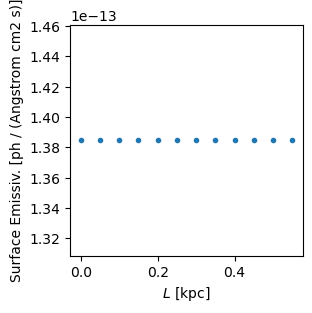

Unit("ph / (Angstrom cm2 s)")

In [19]:
# integrate along the bandwidth
# calculate spectral spatial emissivity
dFdw_erg_hz_cm2 = np.zeros(np.shape(T_aqn_ev)) * skymap_units #u.erg/u.cm**2/u.s/u.Hz
for nu in frequency_band:
    print(nu)
    dFdw_erg_hz_cm2 += convert_to_skymap_units(spectral_surface_emissivity_cgs(nu, T_aqn_ev), nu)

plt.figure(dpi=100,figsize=(3,3))
plt.plot(l_list,dFdw_erg_hz_cm2[:,500], ".")
plt.xlabel("$L$ [kpc]")
plt.ylabel("Surface Emissiv. ["+str(dFdw_erg_hz_cm2.unit)+"]")
plt.show()
dFdw_erg_hz_cm2.unit

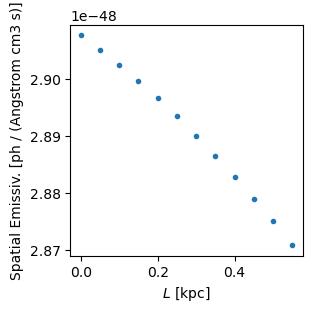

Unit("ph / (Angstrom cm3 s)")

In [20]:
# calculate spectral spatial emissivity
dFdomega_erg_hz_cm3 = dFdw_erg_hz_cm2  * R_aqn_cm**2 * n_aqn_cm3.to(1/u.cm**3) #*4*np.pi

plt.figure(dpi=100,figsize=(3,3))
plt.plot(l_list,dFdomega_erg_hz_cm3[:,500], ".")
plt.xlabel("$L$ [kpc]")
plt.ylabel("Spatial Emissiv. ["+str(dFdomega_erg_hz_cm3.unit)+"]")
plt.show()
dFdomega_erg_hz_cm3.unit

In [21]:
# integrate along sightline
F_tot_erg_hz_cm2 = np.sum(dFdomega_erg_hz_cm3,0) /(4*np.pi*u.sr) * dl.cgs #* dOmega
if remove_low_lat:
    F_tot_erg_hz_cm2[low_lat_filter] = 0
#F_tot_erg_hz_cm2[low_lat_filter] = 0
sum(F_tot_erg_hz_cm2)

<Quantity 2.10529525e-23 ph / (Angstrom cm2 s sr)>

In [22]:
F_tot_erg_hz_cm2[low_lat_filter]

<Quantity [4.50764909e-28, 4.50750170e-28, 4.50720706e-28, ...,
           4.49841033e-28, 4.49876383e-28, 4.49897604e-28] ph / (Angstrom cm2 s sr)>

In [23]:
print(F_tot_erg_hz_cm2)

[4.28038467e-28 4.27632971e-28 4.27632971e-28 ... 4.27632971e-28
 4.27632971e-28 4.28038467e-28] ph / (Angstrom cm2 s sr)


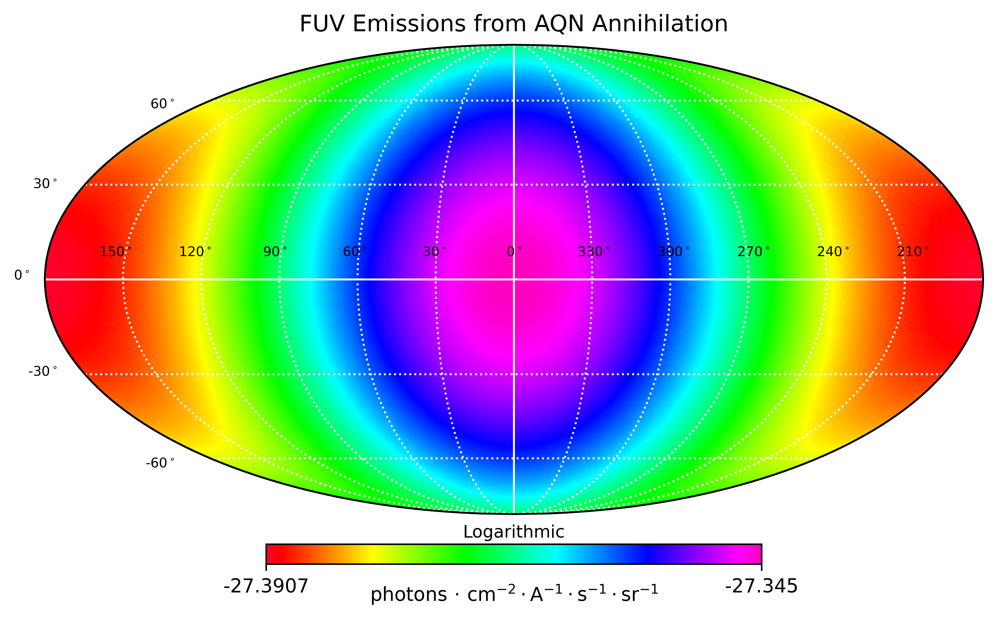

In [24]:
f1 = plt.figure(figsize=(7.5,4.5), dpi=700)
# rotation in (lat, long, psi)
hp.mollview(np.log10(F_tot_erg_hz_cm2.value), 
            title="FUV Emissions from AQN Annihilation", 
            rot=(0,0,0),
            cmap='gist_rainbow', 
            fig=f1, 
            unit="")

#hp.graticule(dmer=360,dpar=360,alpha=0)  
hp.graticule(dmer=30,dpar=30, alpha=1, color="white", linewidth=10)
longitude_labels = [150,120,90,60,30,0,330,300,270,240,210]
for i in range(len(longitude_labels)):
    plt.text((-5+i)*0.34,0.1,str(longitude_labels[i])+"$^\circ$",size=7,horizontalalignment="center")
    
latitude_labels = [-60,-30,0,30,60]
plt.text(-2.01,-0.41,"-30$^\circ$",size=7,horizontalalignment="center") 
plt.text(-2.1,0,"0$^\circ$",size=7,horizontalalignment="center")
plt.text(-2,0.39,"30$^\circ$",size=7,horizontalalignment="center") 
plt.text(-1.5,0.73,"60$^\circ$",size=7,horizontalalignment="center") 
plt.text(-1.51,-0.8,"-60$^\circ$",size=7,horizontalalignment="center") 

plt.text(0,-1.10,"Logarithmic",size=9,horizontalalignment="center")
plt.text(0,-1.37,"photons$\,\cdot\,$cm$^{-2}\cdot$A$^{-1}\cdot$s$^{-1}\cdot$sr$^{-1}$",size=10,horizontalalignment="center")

#plt.savefig("BURKERT & CONST VM 5eV.png")
plt.show()

## Combining the demonstration above into a function

In [44]:
def create_skymap(signal):
    f1 = plt.figure(figsize=(7.5,4.5), dpi=700)
    # rotation in (lat, long, psi)
    hp.mollview(np.log10(signal.value), 
                title="FUV Emissions from AQN Annihilation", 
                rot=(0,0,0),
                cmap='gist_rainbow', 
                fig=f1, 
                unit="")

    #hp.graticule(dmer=360,dpar=360,alpha=0)  
    hp.graticule(dmer=30,dpar=30, alpha=1, color="white", linewidth=10)
    longitude_labels = [150,120,90,60,30,0,330,300,270,240,210]
    for i in range(len(longitude_labels)):
        plt.text((-5+i)*0.34,0.1,str(longitude_labels[i])+"$^\circ$",size=7,horizontalalignment="center")

    latitude_labels = [-60,-30,0,30,60]
    plt.text(-2.01,-0.41,"-30$^\circ$",size=7,horizontalalignment="center") 
    plt.text(-2.1,0,"0$^\circ$",size=7,horizontalalignment="center")
    plt.text(-2,0.39,"30$^\circ$",size=7,horizontalalignment="center") 
    plt.text(-1.5,0.73,"60$^\circ$",size=7,horizontalalignment="center") 
    plt.text(-1.51,-0.8,"-60$^\circ$",size=7,horizontalalignment="center") 

    plt.text(0,-1.10,"Logarithmic",size=9,horizontalalignment="center")
    plt.text(0,-1.37,"photons$\,\cdot\,$cm$^{-2}\cdot$A$^{-1}\cdot$s$^{-1}\cdot$sr$^{-1}$",size=10,horizontalalignment="center")

    #plt.savefig("BURKERT & CONST VM 5eV.png")
    plt.show()
    
def create_skymap_T_aqn(signal, disp_text):
    f1 = plt.figure(figsize=(7.5,4.5), dpi=700)
    # rotation in (lat, long, psi)
    hp.mollview(signal.value, 
                title="$T_{AQN}$, "+str(disp_text), 
                rot=(0,0,0),
                cmap='gist_rainbow', 
                fig=f1, 
                unit="")

    #hp.graticule(dmer=360,dpar=360,alpha=0)  
    hp.graticule(dmer=30,dpar=30, alpha=1, color="white", linewidth=10)
    longitude_labels = [150,120,90,60,30,0,330,300,270,240,210]
    for i in range(len(longitude_labels)):
        plt.text((-5+i)*0.34,0.1,str(longitude_labels[i])+"$^\circ$",size=7,horizontalalignment="center")

    latitude_labels = [-60,-30,0,30,60]
    plt.text(-2.01,-0.41,"-30$^\circ$",size=7,horizontalalignment="center") 
    plt.text(-2.1,0,"0$^\circ$",size=7,horizontalalignment="center")
    plt.text(-2,0.39,"30$^\circ$",size=7,horizontalalignment="center") 
    plt.text(-1.5,0.73,"60$^\circ$",size=7,horizontalalignment="center") 
    plt.text(-1.51,-0.8,"-60$^\circ$",size=7,horizontalalignment="center") 

    #plt.text(0,-1.10,"",size=9,horizontalalignment="center")
    plt.text(0,-1.37,"eV",size=10,horizontalalignment="center")

    #plt.savefig("BURKERT & CONST VM 5eV.png")
    plt.show()

In [26]:
def calc_F_tot(dm_model, vm_model, l_min, l_max, dl, NSIDE, disp):
    ionized_gas = False
    # ########### NFW Profile #############################################
    if dm_model == "NFW Profile":
        rho_0h = 0.0106 * u.solMass / u.pc**3
        r_h = 19.0 * u.kpc

        def rho_halo(R_kpc):
            return rho_0h.to(u.kg/u.m**3) / ((R_kpc/r_h)*(1+R_kpc/r_h)**2)

        def n_halo(R_none):
            return (rho_halo(R_none*u.kpc) / m_aqn_kg).to(1/u.cm**3)
    # #####################################################################

    # # ########### constant density #########################################
    if dm_model == "Constant DM density":
        n_aqn_const_cm3 = 0.3/1e25 * u.cm**-3
        def n_halo(R_none):
            return np.ones(np.shape(R_none)) * n_aqn_const_cm3
    # # ######################################################################

    ########### Burkert Profile #########################################
    if dm_model == "Burkert Profile":
        vh = 414 * u.km / u.s
        r0 = 7.8 * u.kpc
        rho0 = (vh**2 / (4*np.pi * r0**2 * cst.G)).to(u.kg/u.m**3)

        def rho_halo(R_kpc):
            return rho0 * r0**3 / ( (R_kpc+r0)*((R_kpc)**2 + r0**2) )

        def n_halo(R_none):
            return (rho_halo(R_none*u.kpc) / m_aqn_kg).to(1/u.cm**3)
    #####################################################################
    
    if disp:
        plt.figure(dpi=100,figsize=(3,3))
        plt.plot(np.arange(l_min,l_max,0.1), n_halo(np.arange(l_min,l_max,0.1)))
        plt.xlabel("$R$ [kpc]")
        plt.ylabel("$n_{DM}$ [cm$^{-3}$]")
        plt.yscale("log")
        plt.title(dm_model, size=15)
        #plt.savefig(dm_model_name+".png", bbox_inches='tight')
        plt.show()
    
    ########################################################################
    
    
    ############# constant density ######################################### 
    if vm_model == "Constant VM density":
        n_cold_cm3 = 1.0e-1 * u.cm**-3
        def n_vm(R_none):
            return np.ones(np.shape(R_none)) * n_cold_cm3
    ########################################################################

    ############# gas components ######################################### 
    if vm_model == "Gas Components":
        [a1_c, b1_c, c1_c, 
         a2_c, b2_c, c2_c, 
         a3_c, b3_c, c3_c, 
         a4_c, b4_c, c4_c, 
         a5_c, b5_c, c5_c, 
         a6_c, b6_c, c6_c] = [30.04649796,  0.4079755,  3.77607598,  
                      1e3,3e-1,15,
                     2.6e4,5e-2,3,
                     0,0,0,
                     0,0,0,
                     0,0,0,]

        [a1_w, b1_w, c1_w, 
         a2_w, b2_w, c2_w, 
         a3_w, b3_w, c3_w, 
         a4_w, b4_w, c4_w, 
         a5_w, b5_w, c5_w, 
         a6_w, b6_w, c6_w] = [1.1e0,1e-1,0.22,
                      1.7e1,12e-1,110,
                      0.575e4,8.2e-2,13.7,
                     0,0,0,
                     0,0,0,
                     0,0,0,]

        [a1_wh, b1_wh, c1_wh, 
         a2_wh, b2_wh, c2_wh, 
         a3_wh, b3_wh, c3_wh, 
         a4_wh, b4_wh, c4_wh, 
         a5_wh, b5_wh, c5_wh, 
         a6_wh, b6_wh, c6_wh] = [6.1e1,4.4e-1,1.8,
                      9e2,9.2e-2,2.8,
                      1.5e4,7e-2,9,
                     0,0,0,
                     0,0,0,
                     0,0,0,]

        [a1_h, b1_h, c1_h, 
         a2_h, b2_h, c2_h, 
         a3_h, b3_h, c3_h, 
         a4_h, b4_h, c4_h, 
         a5_h, b5_h, c5_h, 
         a6_h, b6_h, c6_h] = [2e2,4e-1,9.5,
                      1e4,10e-2,6,
                      2.6e4,3e-2,3.1,
                      0,0,0,
                      0,0,0,
                      0,0,0,]

        from astropy.cosmology import WMAP7             # WMAP 7-year cosmology
        rho_crit_z05_cgs = WMAP7.critical_density(0.5)  # critical density at z = 0.5  
        rho_crit_z05_si = rho_crit_z05_cgs.to(u.kg / u.m**3)
        r_vir_kpc = 233 * u.kpc

        def rho_gas_component(R_kpc,gas_component):
            x = (R_kpc/r_vir_kpc).value
            if gas_component == "cold":
                return  (a1_c / (1+(x/b1_c)**2)**c1_c + \
                         a2_c / (1+(x/b2_c)**2)**c2_c + \
                         a3_c / (1+(x/b3_c)**2)**c3_c) * rho_crit_z05_si
            if gas_component == "warm":
                return  (a1_w / (1+(x/b1_w)**2)**c1_w + \
                         a2_w / (1+(x/b2_w)**2)**c2_w + \
                         a3_w / (1+(x/b3_w)**2)**c3_w) * rho_crit_z05_si
            if gas_component == "warm-hot":
                return  (a1_wh / (1+(x/b1_wh)**2)**c1_wh + \
                         a2_wh / (1+(x/b2_wh)**2)**c2_wh + \
                         a3_wh / (1+(x/b3_wh)**2)**c3_wh) * rho_crit_z05_si 
            if gas_component == "hot":
                return  (a1_h / (1+(x/b1_h)**2)**c1_h + \
                         a2_h / (1+(x/b2_h)**2)**c2_h + \
                         a3_h / (1+(x/b3_h)**2)**c3_h) * rho_crit_z05_si 

        def n_gas_component(R_none, gas_component):
            return rho_gas_component(R_none*u.kpc, gas_component) / cst.m_p.si


        def rho_gas(R_none):
            return rho_gas_component(R_none,"cold") + rho_gas_component(R_none,"warm") + rho_gas_component(R_none,"warm-hot") + rho_gas_component(R_none,"hot")

        def n_vm(R_none):
            return rho_gas(R_none) / cst.m_p.si
        
        ionized_gas = True
    ########################################################################
    
    if disp:
        plt.figure(dpi=100,figsize=(3,3))
        plt.plot(np.arange(l_min,l_max,0.1), n_vm(np.arange(l_min,l_max,0.1)))
        plt.xlabel("$R$ [kpc]")
        plt.ylabel("$n_{VM}$ [cm$^{-3}$]")
        #plt.yscale("log")
        plt.title(vm_model, size=15)
        #plt.savefig(dm_model_name+".png", bbox_inches='tight')
        plt.show()
    
    ########################################################################
    
    
    
    # some resolution parameters
    print("NSIDE is", NSIDE)
    #NSIDE = 2**6
    wavelength_band_resolution = 30
    frequency_band_resolution = 0.5e14
    NPIX = hp.nside2npix(NSIDE)
    print("NPIX is", NPIX)
    dOmega = hp.nside2pixarea(nside=NSIDE)
    print("dOmega is", dOmega)
    remove_low_lat = False

    # array of theta, phi, for each pixel
    theta, phi = hp.pix2ang(nside = NSIDE, ipix = list(range(NPIX)))
    low_lat_filter = (np.degrees(theta) > 73) & (np.degrees(theta) < 113)
    high_lat_filter = (np.degrees(theta) < 73) | (np.degrees(theta) > 113)

    # frequency band
    frequency_band = np.arange(f_min_hz.value, f_max_hz.value, frequency_band_resolution) * u.Hz

    #print("using NSIDE of:", NSIDE)
    #print("     dOmega is:", dOmega)
    
    
    
    
    
    # sightline elements
    l_min_kpc = l_min*u.kpc
    l_max_kpc = l_max*u.kpc
    l_list = np.arange(l_min_kpc.value,l_max_kpc.value,dl.value)[:, np.newaxis]

    # 2D array of distance elements along each sightline, sun-centric
    l_array = np.ones((len(l_list),len(theta))) * l_list
    if remove_low_lat:             # number of pixels
        l_array[:,low_lat_filter] = 0

    # 2D array of distance elements along each sightline, galaxy-centric
    x = l_array * np.sin(theta) * np.cos(phi) - sun_mw_distance_kpc.value
    y = l_array * np.sin(theta) * np.sin(phi)
    z = l_array * np.cos(theta)
    R_array = np.sqrt(x**2 + y**2 + z**2)

    # calculate AQN number density
    n_aqn_cm3 = n_halo(R_array)
    
    h_func_cutoff = 17 + 12*np.log(2)
    def h(x):
        return_array = np.copy(x)
        return_array[np.where(x<1)] = (17 - 12*np.log(x[np.where(x<1)]/2))
        return_array[np.where(x>=1)] = h_func_cutoff
        return return_array
    
    if not ionized_gas:
 
        
        
        # calculate VM number density
        n_vm_cm3 = n_vm(R_array) 

        # calculate AQN temperature
        def T_AQN_neutral(n_bar, Dv, f, g):
            return (3/32 * np.pi * (1-g) * f * Dv * 1/(cst.alpha**(5/2)) * m_p_erg * (m_e_erg)**(1/4) * 
                    ((n_bar).to(1/u.cm**3) * invcm_to_erg**3))**(4/17) * erg_to_eV

        
        
        # erg Hz^-1 s^-1 cm^-2
        # nu Hz
        # T eV
        def spectral_surface_emissivity_cgs(nu, T):
            T_K = T * eV_to_K
            k_B_cgs = cst.k_B.cgs
            h_cgs = cst.h.cgs

            return  (1/u.Hz)*(1/cst.hbar.cgs * 1/cst.c.cgs)**2 * 4/45 * (k_B_cgs * T_K)**3 * cst.alpha ** (5/2) * 1/np.pi * ((k_B_cgs * T_K)/(m_e_eV*eV_to_erg))**(1/4) * (1 + (h_cgs * nu)/(k_B_cgs * T_K)) * np.exp(- (h_cgs * nu)/(k_B_cgs * T_K)) * h((h_cgs * nu)/(k_B_cgs * T_K))/u.s

        
        T_aqn_ev = T_AQN_neutral(n_vm_cm3, Dv, f, g)

        if disp:
            plt.figure(dpi=100,figsize=(3,3))
            plt.plot(l_list,T_aqn_ev[:,500], ".")
            plt.xlabel("$L$ [kpc]")
            plt.ylabel("$T_AQN$ [eV]")
            plt.show()


        # integrate along the bandwidth
        # calculate spectral spatial emissivity
        dFdw_erg_hz_cm2 = np.zeros(np.shape(T_aqn_ev)) * skymap_units #u.erg/u.cm**2/u.s/u.Hz
        for nu in frequency_band:
            #print(nu)
            dFdw_erg_hz_cm2 += convert_to_skymap_units(spectral_surface_emissivity_cgs(nu, T_aqn_ev), nu)

        if disp:
            plt.figure(dpi=100,figsize=(3,3))
            plt.plot(l_list,dFdw_erg_hz_cm2[:,500], ".")
            plt.xlabel("$L$ [kpc]")
            plt.ylabel("Surface Emissiv. ["+str(dFdw_erg_hz_cm2.unit)+"]")
            plt.show()


        # calculate spectral spatial emissivity
        dFdomega_erg_hz_cm3 = dFdw_erg_hz_cm2  * R_aqn_cm**2 * n_aqn_cm3.to(1/u.cm**3) #*4*np.pi

        if disp:
            plt.figure(dpi=100,figsize=(3,3))
            plt.plot(l_list,dFdomega_erg_hz_cm3[:,500], ".")
            plt.xlabel("$L$ [kpc]")
            plt.ylabel("Spatial Emissiv. ["+str(dFdomega_erg_hz_cm3.unit)+"]")
            plt.show()

        # integrate along sightline
        F_tot_erg_hz_cm2 = np.sum(dFdomega_erg_hz_cm3,0) /(4*np.pi*u.sr) * dl.cgs * dOmega ##############
        if remove_low_lat:
            F_tot_erg_hz_cm2[low_lat_filter] = 0
        #F_tot_erg_hz_cm2[low_lat_filter] = 0
    
    else:
        # calculate mass densities of each gas component
        n_cold     = n_gas_component(R_array, "cold") 
        
        n_warm     = n_gas_component(R_array, "warm") # avoid setting variables
        T_warm     = (3e4 + 1e5)/2 * u.K * K_to_eV

        n_warm_hot = n_gas_component(R_array, "warm-hot")
        T_warm_hot = (1e5 + 1e6)/2 * u.K * K_to_eV

        n_hot      = n_gas_component(R_array, "hot")
        T_hot      = 1e6 * u.K * K_to_eV
        
        
        
        spectral_surface_emissivity_u_factor = (1 / cst.hbar.cgs) * (1/(cst.hbar.cgs * cst.c.cgs))**2 * (cst.hbar.cgs * 1/u.Hz * 1/u.s)
        def spectral_surface_emissivity(T, frequency_band):
            res = np.zeros(np.shape(T)) * u.photon / u.cm**2 / u.s / u.Angstrom / u.sr  # * u.erg/u.Hz/u.s/u.cm**2/u.sr# # 
            res[T<0] = -1 * u.photon / u.cm**2 / u.s / u.Angstrom / u.sr  # * u.erg/u.Hz/u.s/u.cm**2/u.sr 
            f = frequency_band[0]
            T = T * eV_to_erg
            for i in range(len(frequency_band)):
                w_div_T = (2*np.pi*Hz_to_erg)*frequency_band[i] / T
                res_new = spectral_surface_emissivity_u_factor * 4/45 * \
                            T[T>0]**3 * cst.alpha ** (5/2) * 1/np.pi * \
                           (T[T>0]/(m_e_eV*eV_to_erg))**(1/4) * \
                           (1 + w_div_T[T>0]) * np.exp(- w_div_T[T>0]) * h(w_div_T[T>0]) * 1/(dOmega*u.sr)
                res_new = convert_to_skymap_units(res_new, frequency_band[i])
                #print(res_new)
                res[T>0] += res_new #* conversion_array[i] 
            return res 


        def spectral_spatial_emissivity_cold(n_AQN, n_bar, Dv, f, g, frequency_band):
            T_AQN = T_AQN_analytical(n_cold, Dv, f, g)
            dFdw = spectral_surface_emissivity(T_AQN, frequency_band)
            return dFdw 

        def spectral_spatial_emissivity_hot(n_AQN, n_bar, Dv, f, g, T_gas, R_AQN, nu):
            T_neu_eV = T_AQN_analytical(n_bar, Dv, f, g)
            T_ion_eV = T_AQN_ionized2(n_bar, Dv, f, g, T_gas, R_AQN)
            T_AQN = T_neu_eV.copy()                   # don't need this, use T_neu_eV
            ion_greater_neu = np.where(T_ion_eV > T_neu_eV)
            T_AQN[ion_greater_neu] = T_ion_eV[ion_greater_neu]
            dFdw = spectral_surface_emissivity(T_AQN, frequency_band)
            #dF = np.sum(dFdw,2)
            return dFdw
        
        def plot_temp(n_AQN, n_bar, Dv, f, g, T_gas, R_AQN, nu):
            T_neu_eV = T_AQN_analytical(n_bar, Dv, f, g)
            T_ion_eV = T_AQN_ionized2(n_bar, Dv, f, g, T_gas, R_AQN)
            T_AQN = T_neu_eV.copy()                   # don't need this, use T_neu_eV
            ion_greater_neu = np.where(T_ion_eV > T_neu_eV)
            T_AQN[ion_greater_neu] = T_ion_eV[ion_greater_neu]
            dFdw = spectral_surface_emissivity(T_AQN, frequency_band)
            #dF = np.sum(dFdw,2)


        def func(n_c, n_w, n_wh,n_h, frequency_band):
            epsilon = (spectral_spatial_emissivity_cold(n_aqn_cm3, n_c,  Dv, f, g,                    frequency_band) +
                       spectral_spatial_emissivity_hot( n_aqn_cm3, n_w,  Dv, f, g, T_warm,     R_aqn_cm, frequency_band) +
                       spectral_spatial_emissivity_hot( n_aqn_cm3, n_wh, Dv, f, g, T_warm_hot, R_aqn_cm, frequency_band) +
                       spectral_spatial_emissivity_hot( n_aqn_cm3, n_h,  Dv, f, g, T_hot,      R_aqn_cm, frequency_band))* \
                4 * np.pi * R_aqn_cm**2 * n_aqn_cm3.to(1/u.cm**3)
            return epsilon.value
        
        F_tot_erg_hz_cm2 = sum(func(n_cold,n_warm,n_warm_hot,n_hot, frequency_band)) / (4*np.pi) * (dl.cgs) * dOmega

        
         
    return F_tot_erg_hz_cm2

#F_tot_erg_hz_cm2 = calc_F_tot("NFW Profile", "Constant VM density", 0.6,50, dl = 0.5 * u.kpc, NSIDE = 2**6)
#F_tot_erg_hz_cm2 = calc_F_tot("NFW Profile", "Gas Components", 0.6,50, dl = 0.5 * u.kpc)
#create_skymap(F_tot_erg_hz_cm2)





## Verifying relation between NSIDE and total flux

0.016362461737446838
NSIDE is 8
NPIX is 768
dOmega is 0.016362461737446838
Total flux 4.3848484765224756e-26


0.0040906154343617095
NSIDE is 16
NPIX is 3072
dOmega is 0.0040906154343617095
Total flux 4.384848476522189e-26


0.0010226538585904274
NSIDE is 32
NPIX is 12288
dOmega is 0.0010226538585904274
Total flux 4.3848484765218936e-26


0.00025566346464760684
NSIDE is 64
NPIX is 49152
dOmega is 0.00025566346464760684
Total flux 4.384848476525675e-26


6.391586616190171e-05
NSIDE is 128
NPIX is 196608
dOmega is 6.391586616190171e-05
Total flux 4.384848476503775e-26


1.5978966540475428e-05
NSIDE is 256
NPIX is 786432
dOmega is 1.5978966540475428e-05
Total flux 4.3848484764791436e-26




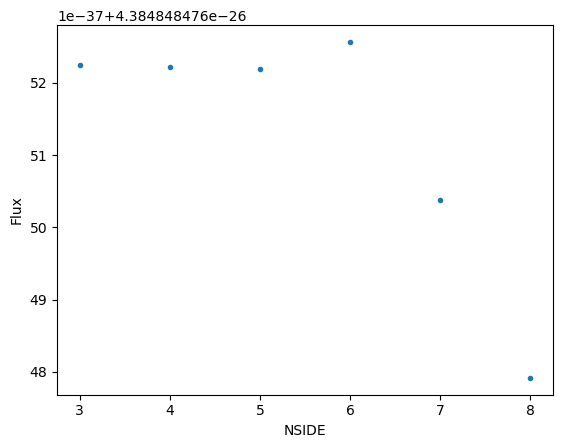

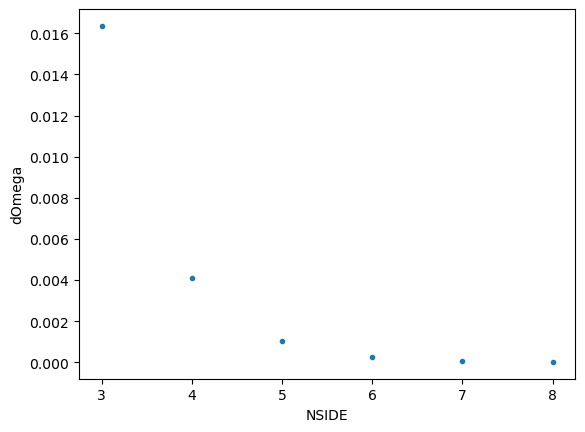

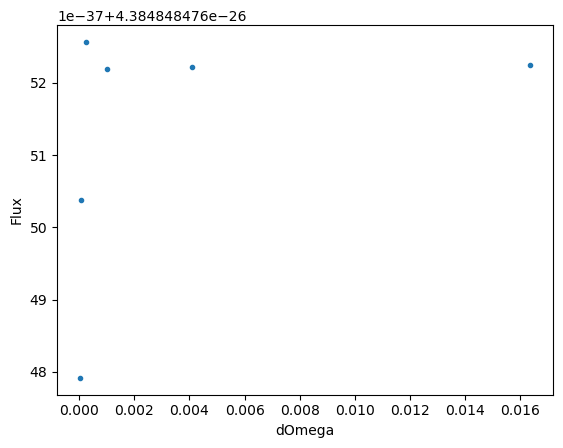

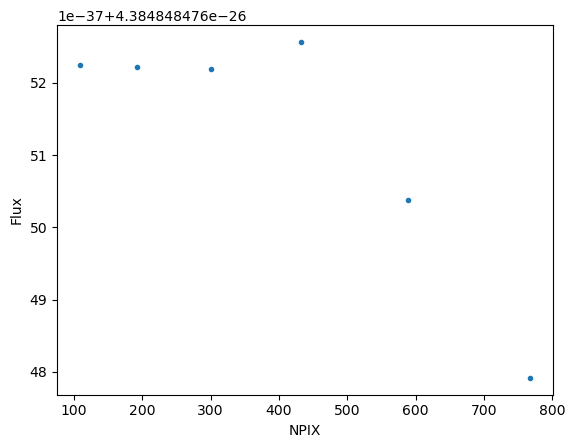

In [28]:
total_flux_array = []
dOmega_array = []
NSIDE_array = [3,4,5,6,7,8]
NPIX_array = []
for i in NSIDE_array:
    #print(i)
    dOmega = hp.nside2pixarea(nside=2**i)
    dOmega_array.append(dOmega)
    print(dOmega)
    total_flux = sum(calc_F_tot("Constant DM density", "Constant VM density", 0.6,5, dl = 0.3 * u.kpc, NSIDE = 2**i, disp=False)).value
    total_flux_array.append(total_flux)
    NPIX = hp.nside2npix(i)
    NPIX_array.append(NPIX)
    print("Total flux", total_flux)
    print("\n")

plt.plot(NSIDE_array,total_flux_array,".")
plt.xlabel("NSIDE")
plt.ylabel("Flux")
plt.show()

plt.plot(NSIDE_array,dOmega_array,".")
plt.xlabel("NSIDE")
plt.ylabel("dOmega")
plt.show()

plt.plot(dOmega_array,total_flux_array,".")
plt.xlabel("dOmega")
plt.ylabel("Flux")
plt.show()


plt.plot(NPIX_array,total_flux_array,".")
plt.xlabel("NPIX")
plt.ylabel("Flux")
plt.show()

<Quantity [2.18457405e-30, 2.15904185e-30, 2.15904185e-30, ...,
           2.15904185e-30, 2.15904185e-30, 2.18457405e-30] ph / (Angstrom cm2 s sr)>

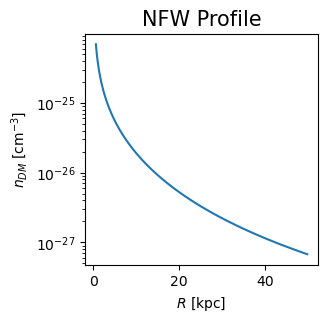

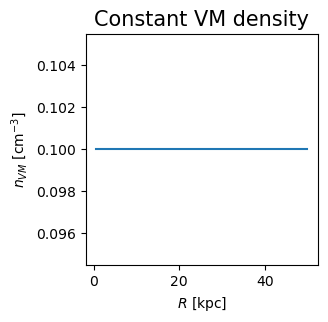

NSIDE is 64
NPIX is 49152
dOmega is 0.00025566346464760684


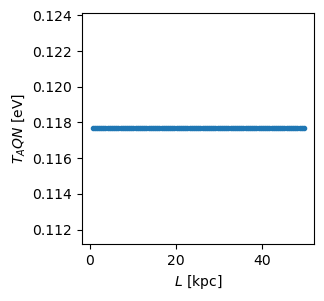

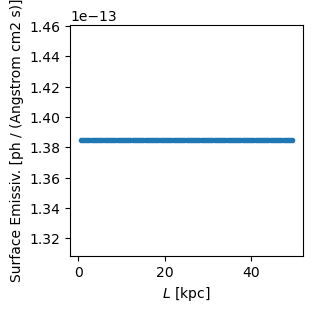

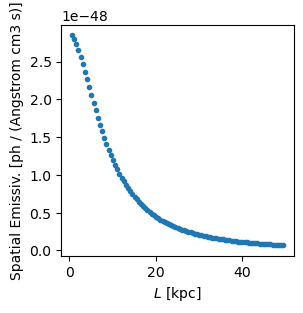

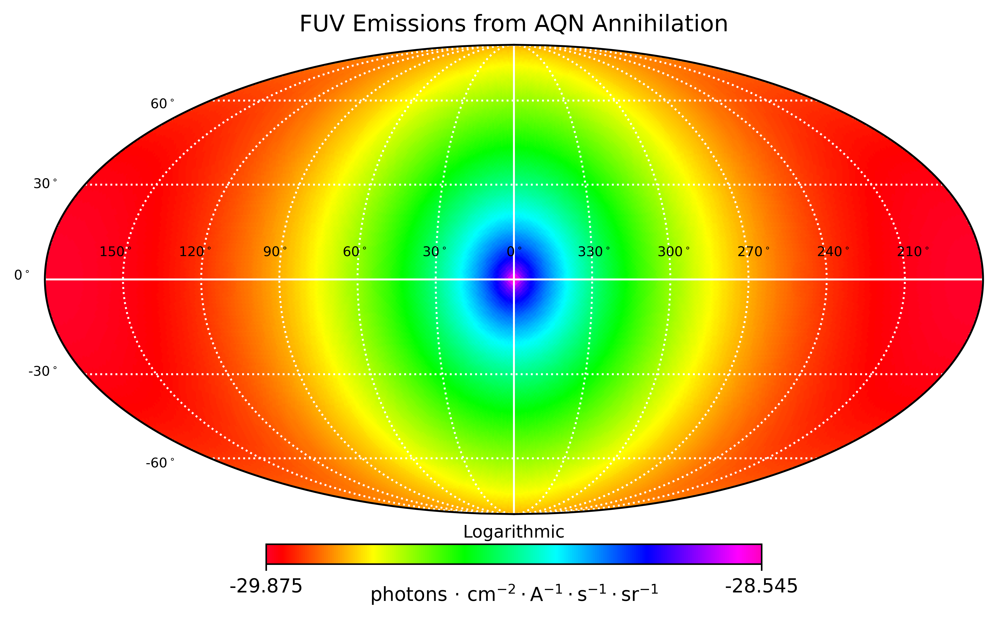

In [34]:
F_tot_galex = calc_F_tot("NFW Profile", "Constant VM density", 0.6,50, dl = 0.5 * u.kpc, NSIDE = 2**6, disp=True)

create_skymap(F_tot_galex)




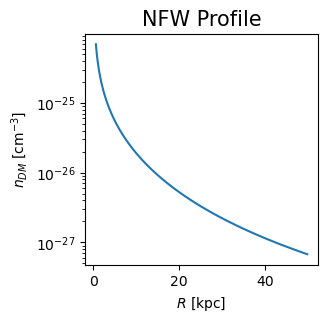

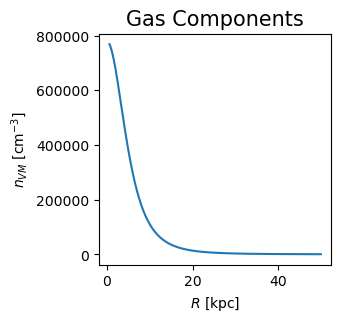

NSIDE is 64
NPIX is 49152
dOmega is 0.00025566346464760684


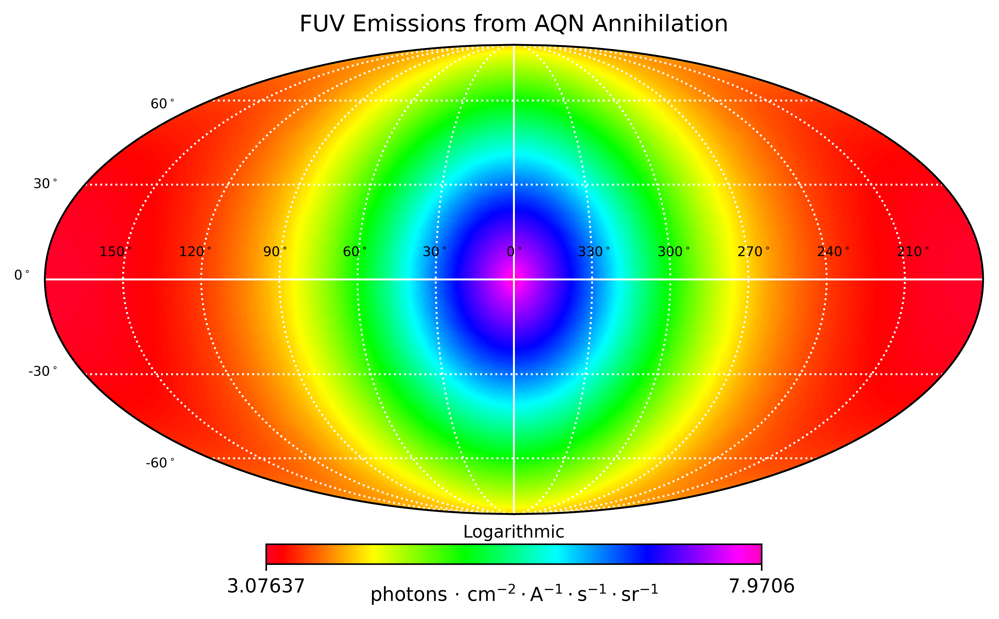

In [35]:
F_tot_galex = calc_F_tot("NFW Profile", "Gas Components", 0.6,50, dl = 0.5 * u.kpc, NSIDE = 2**6, disp=True)

create_skymap(F_tot_galex)




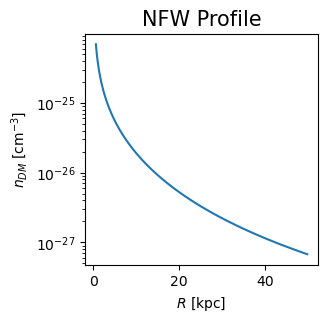

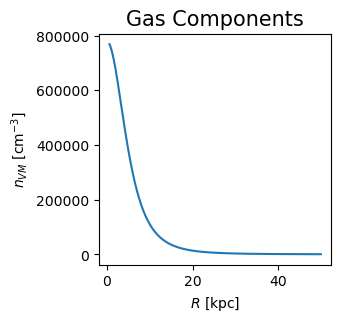

NSIDE is 64
NPIX is 49152
dOmega is 0.00025566346464760684
done


In [65]:
dm_model = "NFW Profile"
vm_model = "Gas Components"
l_min = 0.6
l_max = 50
dl =0.5*u.kpc
NSIDE = 2**6
disp = True

ionized_gas = False
# ########### NFW Profile #############################################
if dm_model == "NFW Profile":
    rho_0h = 0.0106 * u.solMass / u.pc**3
    r_h = 19.0 * u.kpc

    def rho_halo(R_kpc):
        return rho_0h.to(u.kg/u.m**3) / ((R_kpc/r_h)*(1+R_kpc/r_h)**2)

    def n_halo(R_none):
        return (rho_halo(R_none*u.kpc) / m_aqn_kg).to(1/u.cm**3)
# #####################################################################

# # ########### constant density #########################################
if dm_model == "Constant DM density":
    n_aqn_const_cm3 = 0.3/1e25 * u.cm**-3
    def n_halo(R_none):
        return np.ones(np.shape(R_none)) * n_aqn_const_cm3
# # ######################################################################

########### Burkert Profile #########################################
if dm_model == "Burkert Profile":
    vh = 414 * u.km / u.s
    r0 = 7.8 * u.kpc
    rho0 = (vh**2 / (4*np.pi * r0**2 * cst.G)).to(u.kg/u.m**3)

    def rho_halo(R_kpc):
        return rho0 * r0**3 / ( (R_kpc+r0)*((R_kpc)**2 + r0**2) )

    def n_halo(R_none):
        return (rho_halo(R_none*u.kpc) / m_aqn_kg).to(1/u.cm**3)
#####################################################################

if disp:
    plt.figure(dpi=100,figsize=(3,3))
    plt.plot(np.arange(l_min,l_max,0.1), n_halo(np.arange(l_min,l_max,0.1)))
    plt.xlabel("$R$ [kpc]")
    plt.ylabel("$n_{DM}$ [cm$^{-3}$]")
    plt.yscale("log")
    plt.title(dm_model, size=15)
    #plt.savefig(dm_model_name+".png", bbox_inches='tight')
    plt.show()

########################################################################


############# constant density ######################################### 
if vm_model == "Constant VM density":
    n_cold_cm3 = 1.0e-1 * u.cm**-3
    def n_vm(R_none):
        return np.ones(np.shape(R_none)) * n_cold_cm3
########################################################################

############# gas components ######################################### 
if vm_model == "Gas Components":
    [a1_c, b1_c, c1_c, 
     a2_c, b2_c, c2_c, 
     a3_c, b3_c, c3_c, 
     a4_c, b4_c, c4_c, 
     a5_c, b5_c, c5_c, 
     a6_c, b6_c, c6_c] = [30.04649796,  0.4079755,  3.77607598,  
                  1e3,3e-1,15,
                 2.6e4,5e-2,3,
                 0,0,0,
                 0,0,0,
                 0,0,0,]

    [a1_w, b1_w, c1_w, 
     a2_w, b2_w, c2_w, 
     a3_w, b3_w, c3_w, 
     a4_w, b4_w, c4_w, 
     a5_w, b5_w, c5_w, 
     a6_w, b6_w, c6_w] = [1.1e0,1e-1,0.22,
                  1.7e1,12e-1,110,
                  0.575e4,8.2e-2,13.7,
                 0,0,0,
                 0,0,0,
                 0,0,0,]

    [a1_wh, b1_wh, c1_wh, 
     a2_wh, b2_wh, c2_wh, 
     a3_wh, b3_wh, c3_wh, 
     a4_wh, b4_wh, c4_wh, 
     a5_wh, b5_wh, c5_wh, 
     a6_wh, b6_wh, c6_wh] = [6.1e1,4.4e-1,1.8,
                  9e2,9.2e-2,2.8,
                  1.5e4,7e-2,9,
                 0,0,0,
                 0,0,0,
                 0,0,0,]

    [a1_h, b1_h, c1_h, 
     a2_h, b2_h, c2_h, 
     a3_h, b3_h, c3_h, 
     a4_h, b4_h, c4_h, 
     a5_h, b5_h, c5_h, 
     a6_h, b6_h, c6_h] = [2e2,4e-1,9.5,
                  1e4,10e-2,6,
                  2.6e4,3e-2,3.1,
                  0,0,0,
                  0,0,0,
                  0,0,0,]

    from astropy.cosmology import WMAP7             # WMAP 7-year cosmology
    rho_crit_z05_cgs = WMAP7.critical_density(0.5)  # critical density at z = 0.5  
    rho_crit_z05_si = rho_crit_z05_cgs.to(u.kg / u.m**3)
    r_vir_kpc = 233 * u.kpc

    def rho_gas_component(R_kpc,gas_component):
        x = (R_kpc/r_vir_kpc).value
        if gas_component == "cold":
            return  (a1_c / (1+(x/b1_c)**2)**c1_c + \
                     a2_c / (1+(x/b2_c)**2)**c2_c + \
                     a3_c / (1+(x/b3_c)**2)**c3_c) * rho_crit_z05_si
        if gas_component == "warm":
            return  (a1_w / (1+(x/b1_w)**2)**c1_w + \
                     a2_w / (1+(x/b2_w)**2)**c2_w + \
                     a3_w / (1+(x/b3_w)**2)**c3_w) * rho_crit_z05_si
        if gas_component == "warm-hot":
            return  (a1_wh / (1+(x/b1_wh)**2)**c1_wh + \
                     a2_wh / (1+(x/b2_wh)**2)**c2_wh + \
                     a3_wh / (1+(x/b3_wh)**2)**c3_wh) * rho_crit_z05_si 
        if gas_component == "hot":
            return  (a1_h / (1+(x/b1_h)**2)**c1_h + \
                     a2_h / (1+(x/b2_h)**2)**c2_h + \
                     a3_h / (1+(x/b3_h)**2)**c3_h) * rho_crit_z05_si 

    def n_gas_component(R_none, gas_component):
        return rho_gas_component(R_none*u.kpc, gas_component) / cst.m_p.si


    def rho_gas(R_none):
        return rho_gas_component(R_none,"cold") + rho_gas_component(R_none,"warm") + rho_gas_component(R_none,"warm-hot") + rho_gas_component(R_none,"hot")

    def n_vm(R_none):
        return rho_gas(R_none) / cst.m_p.si

    ionized_gas = True
########################################################################

if disp:
    plt.figure(dpi=100,figsize=(3,3))
    plt.plot(np.arange(l_min,l_max,0.1), n_vm(np.arange(l_min,l_max,0.1)))
    plt.xlabel("$R$ [kpc]")
    plt.ylabel("$n_{VM}$ [cm$^{-3}$]")
    #plt.yscale("log")
    plt.title(vm_model, size=15)
    #plt.savefig(dm_model_name+".png", bbox_inches='tight')
    plt.show()

########################################################################



# some resolution parameters
print("NSIDE is", NSIDE)
#NSIDE = 2**6
wavelength_band_resolution = 30
frequency_band_resolution = 0.5e14
NPIX = hp.nside2npix(NSIDE)
print("NPIX is", NPIX)
dOmega = hp.nside2pixarea(nside=NSIDE)
print("dOmega is", dOmega)
remove_low_lat = False

# array of theta, phi, for each pixel
theta, phi = hp.pix2ang(nside = NSIDE, ipix = list(range(NPIX)))
low_lat_filter = (np.degrees(theta) > 73) & (np.degrees(theta) < 113)
high_lat_filter = (np.degrees(theta) < 73) | (np.degrees(theta) > 113)

# frequency band
frequency_band = np.arange(f_min_hz.value, f_max_hz.value, frequency_band_resolution) * u.Hz

#print("using NSIDE of:", NSIDE)
#print("     dOmega is:", dOmega)





# sightline elements
l_min_kpc = l_min*u.kpc
l_max_kpc = l_max*u.kpc
l_list = np.arange(l_min_kpc.value,l_max_kpc.value,dl.value)[:, np.newaxis]

# 2D array of distance elements along each sightline, sun-centric
l_array = np.ones((len(l_list),len(theta))) * l_list
if remove_low_lat:             # number of pixels
    l_array[:,low_lat_filter] = 0

# 2D array of distance elements along each sightline, galaxy-centric
x = l_array * np.sin(theta) * np.cos(phi) - sun_mw_distance_kpc.value
y = l_array * np.sin(theta) * np.sin(phi)
z = l_array * np.cos(theta)
R_array = np.sqrt(x**2 + y**2 + z**2)

# calculate AQN number density
n_aqn_cm3 = n_halo(R_array)

h_func_cutoff = 17 + 12*np.log(2)
def h(x):
    return_array = np.copy(x)
    return_array[np.where(x<1)] = (17 - 12*np.log(x[np.where(x<1)]/2))
    return_array[np.where(x>=1)] = h_func_cutoff
    return return_array

if not ionized_gas:



    # calculate VM number density
    n_vm_cm3 = n_vm(R_array) 

    # calculate AQN temperature
    def T_AQN_neutral(n_bar, Dv, f, g):
        return (3/32 * np.pi * (1-g) * f * Dv * 1/(cst.alpha**(5/2)) * m_p_erg * (m_e_erg)**(1/4) * 
                ((n_bar).to(1/u.cm**3) * invcm_to_erg**3))**(4/17) * erg_to_eV



    # erg Hz^-1 s^-1 cm^-2
    # nu Hz
    # T eV
    def spectral_surface_emissivity_cgs(nu, T):
        T_K = T * eV_to_K
        k_B_cgs = cst.k_B.cgs
        h_cgs = cst.h.cgs

        return  (1/u.Hz)*(1/cst.hbar.cgs * 1/cst.c.cgs)**2 * 4/45 * (k_B_cgs * T_K)**3 * cst.alpha ** (5/2) * 1/np.pi * ((k_B_cgs * T_K)/(m_e_eV*eV_to_erg))**(1/4) * (1 + (h_cgs * nu)/(k_B_cgs * T_K)) * np.exp(- (h_cgs * nu)/(k_B_cgs * T_K)) * h((h_cgs * nu)/(k_B_cgs * T_K))/u.s


    T_aqn_ev = T_AQN_neutral(n_vm_cm3, Dv, f, g)

    if disp:
        plt.figure(dpi=100,figsize=(3,3))
        plt.plot(l_list,T_aqn_ev[:,500], ".")
        plt.xlabel("$L$ [kpc]")
        plt.ylabel("$T_AQN$ [eV]")
        plt.show()


    # integrate along the bandwidth
    # calculate spectral spatial emissivity
    dFdw_erg_hz_cm2 = np.zeros(np.shape(T_aqn_ev)) * skymap_units #u.erg/u.cm**2/u.s/u.Hz
    for nu in frequency_band:
        #print(nu)
        dFdw_erg_hz_cm2 += convert_to_skymap_units(spectral_surface_emissivity_cgs(nu, T_aqn_ev), nu)

    if disp:
        plt.figure(dpi=100,figsize=(3,3))
        plt.plot(l_list,dFdw_erg_hz_cm2[:,500], ".")
        plt.xlabel("$L$ [kpc]")
        plt.ylabel("Surface Emissiv. ["+str(dFdw_erg_hz_cm2.unit)+"]")
        plt.show()


    # calculate spectral spatial emissivity
    dFdomega_erg_hz_cm3 = dFdw_erg_hz_cm2  * R_aqn_cm**2 * n_aqn_cm3.to(1/u.cm**3) #*4*np.pi

    if disp:
        plt.figure(dpi=100,figsize=(3,3))
        plt.plot(l_list,dFdomega_erg_hz_cm3[:,500], ".")
        plt.xlabel("$L$ [kpc]")
        plt.ylabel("Spatial Emissiv. ["+str(dFdomega_erg_hz_cm3.unit)+"]")
        plt.show()

    # integrate along sightline
    F_tot_erg_hz_cm2 = np.sum(dFdomega_erg_hz_cm3,0) /(4*np.pi*u.sr) * dl.cgs * dOmega ##############
    if remove_low_lat:
        F_tot_erg_hz_cm2[low_lat_filter] = 0
    #F_tot_erg_hz_cm2[low_lat_filter] = 0

else:
    # calculate mass densities of each gas component
    n_cold     = n_gas_component(R_array, "cold") 

    n_warm     = n_gas_component(R_array, "warm") # avoid setting variables
    T_warm     = (3e4 + 1e5)/2 * u.K * K_to_eV

    n_warm_hot = n_gas_component(R_array, "warm-hot")
    T_warm_hot = (1e5 + 1e6)/2 * u.K * K_to_eV

    n_hot      = n_gas_component(R_array, "hot")
    T_hot      = 1e6 * u.K * K_to_eV



    spectral_surface_emissivity_u_factor = (1 / cst.hbar.cgs) * (1/(cst.hbar.cgs * cst.c.cgs))**2 * (cst.hbar.cgs * 1/u.Hz * 1/u.s)
    def spectral_surface_emissivity(T, frequency_band):
        res = np.zeros(np.shape(T)) * u.photon / u.cm**2 / u.s / u.Angstrom / u.sr  # * u.erg/u.Hz/u.s/u.cm**2/u.sr# # 
        res[T<0] = -1 * u.photon / u.cm**2 / u.s / u.Angstrom / u.sr  # * u.erg/u.Hz/u.s/u.cm**2/u.sr 
        f = frequency_band[0]
        T = T * eV_to_erg
        for i in range(len(frequency_band)):
            w_div_T = (2*np.pi*Hz_to_erg)*frequency_band[i] / T
            res_new = spectral_surface_emissivity_u_factor * 4/45 * \
                        T[T>0]**3 * cst.alpha ** (5/2) * 1/np.pi * \
                       (T[T>0]/(m_e_eV*eV_to_erg))**(1/4) * \
                       (1 + w_div_T[T>0]) * np.exp(- w_div_T[T>0]) * h(w_div_T[T>0]) * 1/(dOmega*u.sr)
            res_new = convert_to_skymap_units(res_new, frequency_band[i])
            #print(res_new)
            res[T>0] += res_new #* conversion_array[i] 
        return res 


    def spectral_spatial_emissivity_cold(n_AQN, n_bar, Dv, f, g, frequency_band):
        T_AQN = T_AQN_analytical(n_cold, Dv, f, g)
        dFdw = spectral_surface_emissivity(T_AQN, frequency_band)
        return dFdw 

    def spectral_spatial_emissivity_hot(n_AQN, n_bar, Dv, f, g, T_gas, R_AQN, nu):
        T_neu_eV = T_AQN_analytical(n_bar, Dv, f, g)
        T_ion_eV = T_AQN_ionized2(n_bar, Dv, f, g, T_gas, R_AQN)
        T_AQN = T_neu_eV.copy()                   # don't need this, use T_neu_eV
        ion_greater_neu = np.where(T_ion_eV > T_neu_eV)
        T_AQN[ion_greater_neu] = T_ion_eV[ion_greater_neu]
        dFdw = spectral_surface_emissivity(T_AQN, frequency_band)
        #dF = np.sum(dFdw,2)
        return dFdw
    
    def calc_T_aqn(n_AQN, n_bar, Dv, f, g, T_gas, R_AQN, nu):
        T_neu_eV = T_AQN_analytical(n_bar, Dv, f, g)
        T_ion_eV = T_AQN_ionized2(n_bar, Dv, f, g, T_gas, R_AQN)
        T_AQN = T_neu_eV.copy()                   # don't need this, use T_neu_eV
        ion_greater_neu = np.where(T_ion_eV > T_neu_eV)
        T_AQN[ion_greater_neu] = T_ion_eV[ion_greater_neu]
        dFdw = spectral_surface_emissivity(T_AQN, frequency_band)
        #dF = np.sum(dFdw,2)
        return T_AQN

    def func(n_c, n_w, n_wh,n_h, frequency_band):
        epsilon = (spectral_spatial_emissivity_cold(n_aqn_cm3, n_c,  Dv, f, g,                    frequency_band) +
                   spectral_spatial_emissivity_hot( n_aqn_cm3, n_w,  Dv, f, g, T_warm,     R_aqn_cm, frequency_band) +
                   spectral_spatial_emissivity_hot( n_aqn_cm3, n_wh, Dv, f, g, T_warm_hot, R_aqn_cm, frequency_band) +
                   spectral_spatial_emissivity_hot( n_aqn_cm3, n_h,  Dv, f, g, T_hot,      R_aqn_cm, frequency_band))* \
            4 * np.pi * R_aqn_cm**2 * n_aqn_cm3.to(1/u.cm**3)
        return epsilon #.value
    
    F_tot_galex = sum(func(n_cold,n_warm,n_warm_hot,n_hot, frequency_band)) / (4*np.pi) * (dl.cgs) * dOmega

    T_aqn_cold_ev     = T_AQN_analytical(n_cold, Dv, f, g)
    T_aqn_warm_ev     = calc_T_aqn( n_aqn_cm3, n_warm,  Dv, f, g, T_warm,     R_aqn_cm, frequency_band)
    T_aqn_warm_hot_ev = calc_T_aqn( n_aqn_cm3, n_warm_hot, Dv, f, g, T_warm_hot, R_aqn_cm, frequency_band)
    T_aqn_hot_ev      = calc_T_aqn( n_aqn_cm3, n_hot,  Dv, f, g, T_hot,      R_aqn_cm, frequency_band)
    
    T_aqn_dict_ev = {"cold":     T_aqn_cold_ev, 
                     "warm":     T_aqn_warm_ev,
                     "warm_hot": T_aqn_warm_hot_ev,
                     "hot":      T_aqn_hot_ev}
#F_tot_erg_hz_cm2 = calc_F_tot("NFW Profile", "Constant VM density", 0.6,50, dl = 0.5 * u.kpc, NSIDE = 2**6)
#F_tot_erg_hz_cm2 = calc_F_tot("NFW Profile", "Gas Components", 0.6,50, dl = 0.5 * u.kpc)
#create_skymap(F_tot_erg_hz_cm2)
print("done")

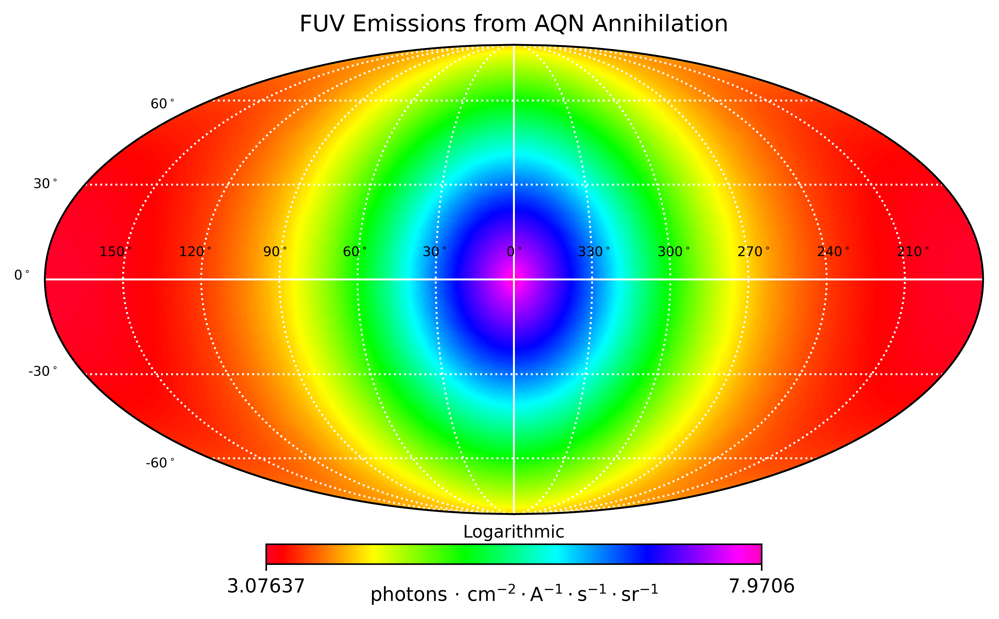

In [104]:
create_skymap(F_tot_galex)


<Quantity [10081.15962289,  9506.08046891,  9506.08046891, ...,
            9506.08046891,  9506.08046891, 10081.15962289] ph / (Angstrom cm2 s sr)>

In [59]:
l_array[5]

array([3.1, 3.1, 3.1, ..., 3.1, 3.1, 3.1])

## Look at $T_{\text{AQN}}$ from a gas component at a particular distance from earth



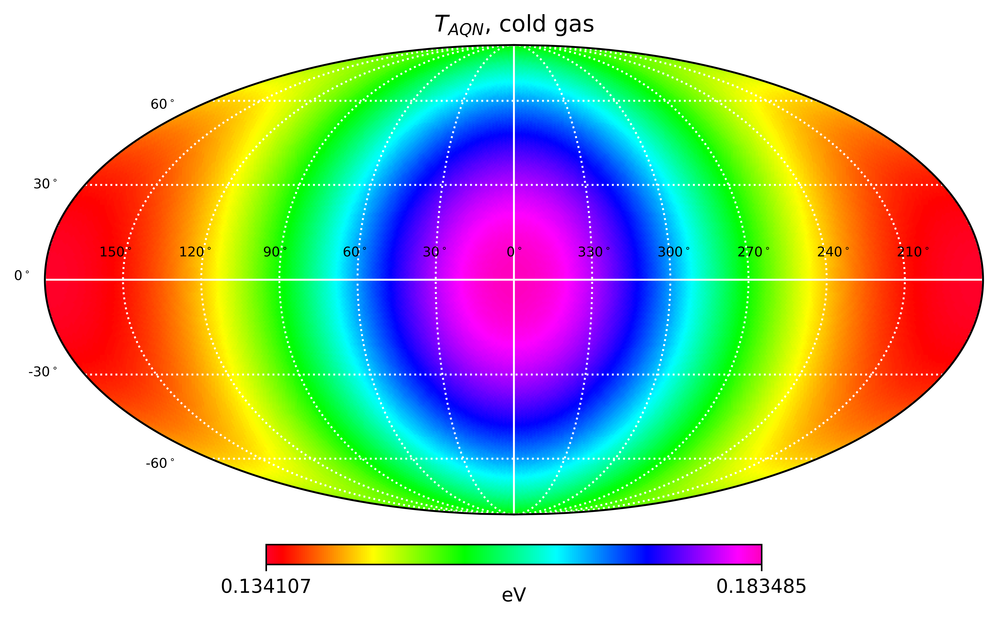

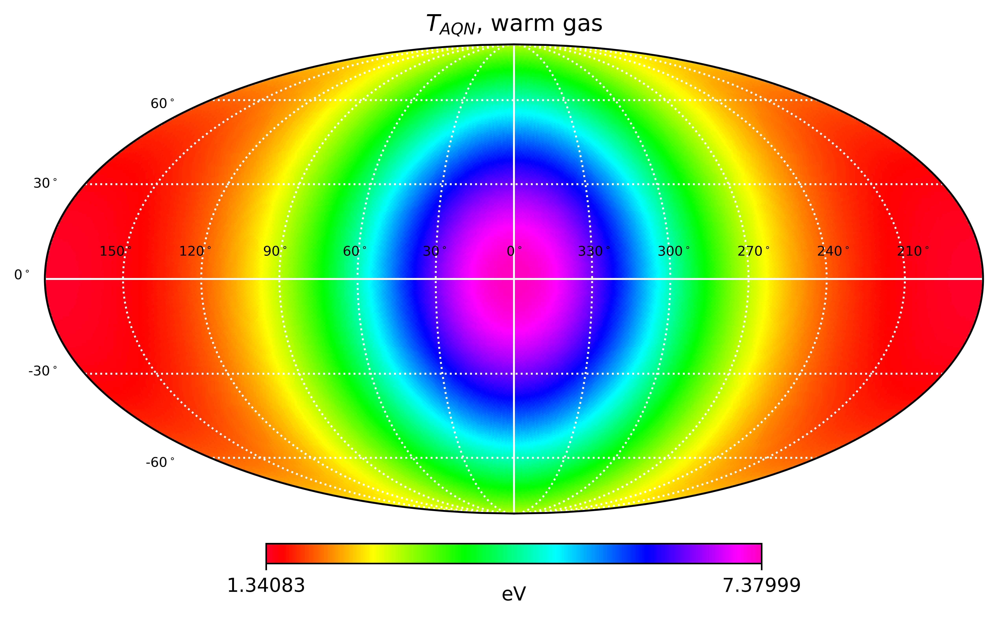

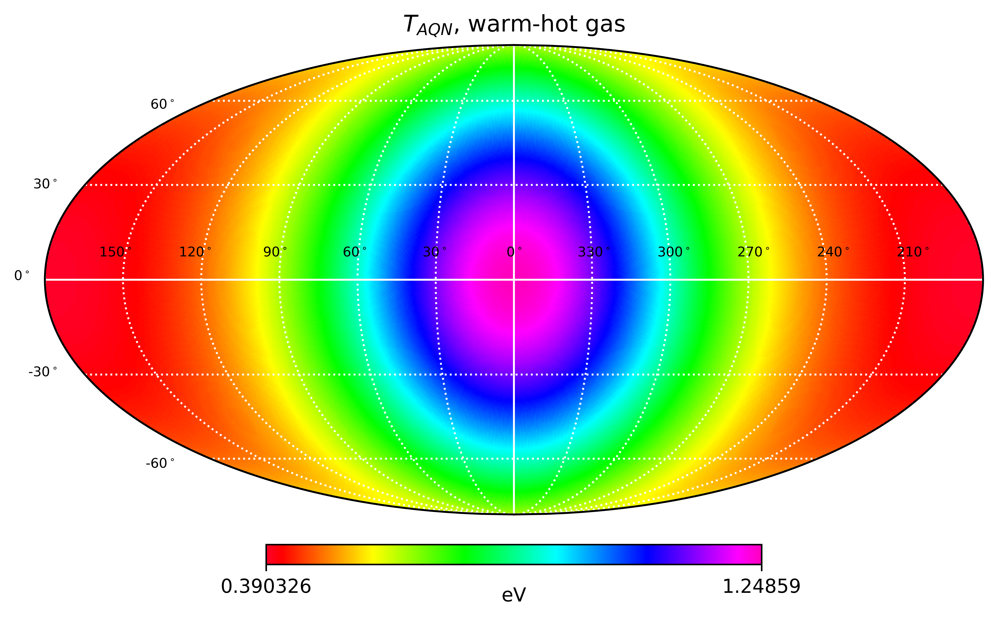

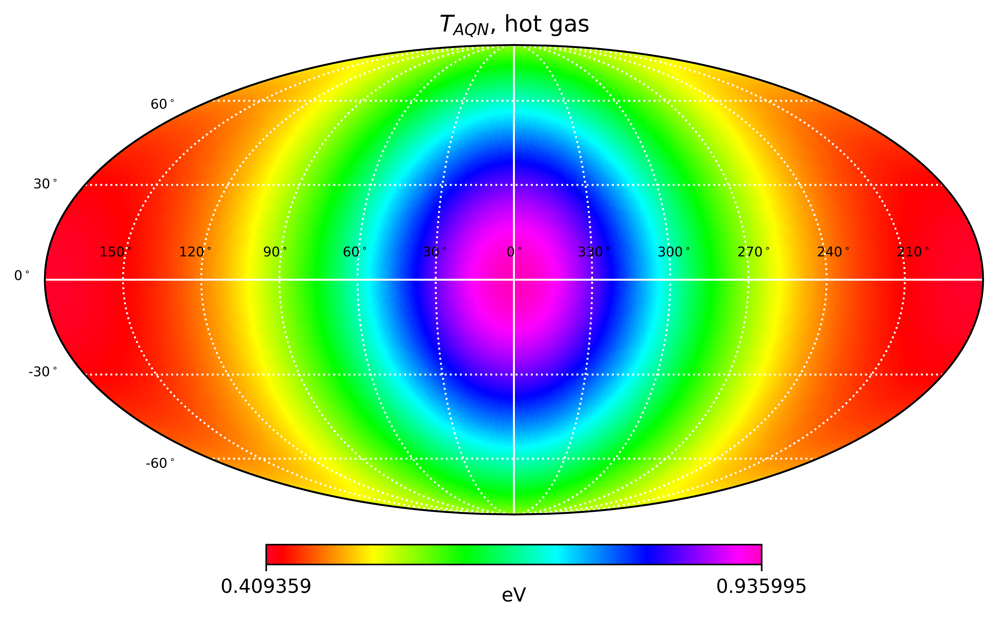

In [60]:
l_array_index = 5
create_skymap_T_aqn(T_aqn_dict_ev["cold"    ][l_array_index,:], "cold gas"    )
create_skymap_T_aqn(T_aqn_dict_ev["warm"    ][l_array_index,:], "warm gas"    )
create_skymap_T_aqn(T_aqn_dict_ev["warm_hot"][l_array_index,:], "warm-hot gas")
create_skymap_T_aqn(T_aqn_dict_ev["hot"     ][l_array_index,:], "hot gas"     )

In [80]:
np.where(theta<=0.05)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23]),)

In [83]:
NSIDE

64

In [88]:
hp.pixelfunc.ang2pix(NSIDE, theta=1, phi=0)

11392

In [91]:
npix = hp.nside2npix(2**3)

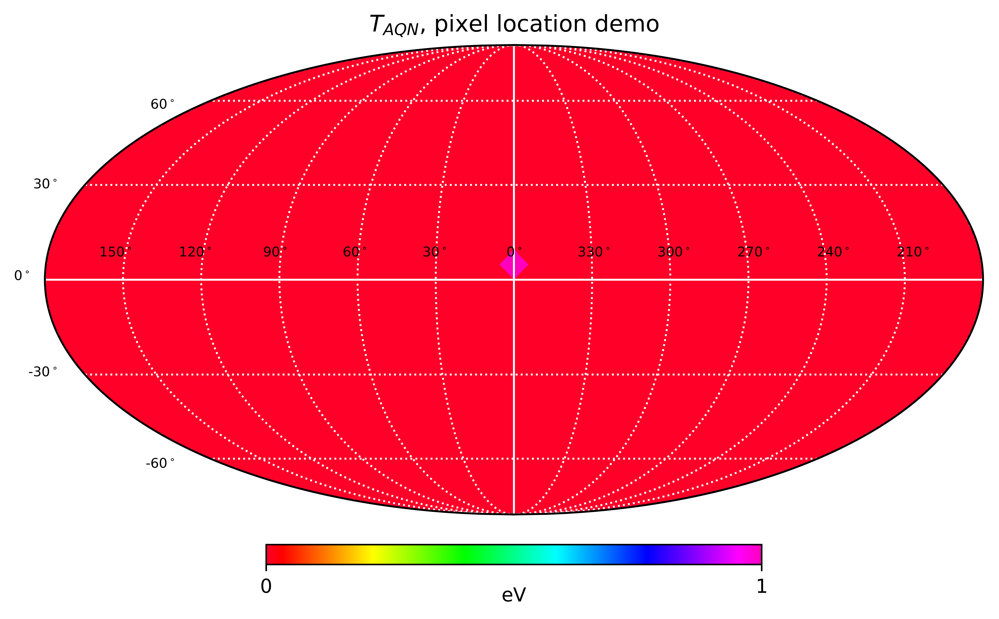

In [125]:
test_array = np.zeros(npix)
test_array[hp.pixelfunc.ang2pix(2**3, theta=np.pi/2, phi=0)] = 1

create_skymap_T_aqn(test_array*u.cm, "pixel location demo")

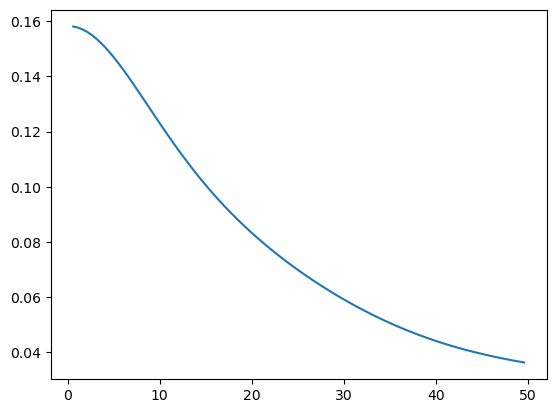

In [117]:
pixel_index = hp.pixelfunc.ang2pix(NSIDE, theta=0, phi=0)
plt.plot(l_array[:,pixel_index],T_aqn_dict_ev["cold"][:,pixel_index])

In [141]:
def plot_temperature_vs_l(T_dict, chosen_theta, chosen_phi):

    pixel_index = hp.pixelfunc.ang2pix(NSIDE, theta=chosen_theta, phi=chosen_phi)

    npix = hp.nside2npix(2**3)
    test_array = np.zeros(npix)
    test_array[hp.pixelfunc.ang2pix(2**3, theta=chosen_theta, phi=chosen_phi)] = 1
    #create_skymap_T_aqn(test_array*u.cm, "pixel location demo")
    hp.mollview(test_array)
    plt.show()


    # Create a 2x2 grid of subplots
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10), dpi=200)

    # Define the titles for each subplot
    titles = ['cold', 'warm', 'warm_hot', 'hot']

    # Loop through each subplot and add a plot with the given title
    for i, ax in enumerate(axes.flat):
        ax.plot(l_array[:,pixel_index], T_dict[titles[i]][:,pixel_index])
        ax.set_title(titles[i]+" gas")
        #ax.set_xlabel('Distance (earth centric) [kpc]')
        #ax.set_ylabel('$T_{AQN}$ (eV)')
    axes[1][0].set_xlabel('Distance (earth centric) [kpc]')
    axes[1][0].set_ylabel('$T_{AQN}$ (eV)')
    # Adjust the layout and padding of the subplots
    fig.tight_layout(pad=3.0)

    fig.suptitle(r'$\theta = $'+str(round(chosen_theta,4))+', $\phi = $'+str(round(chosen_phi,4)), fontsize=18)

    # Display the figure
    plt.show()

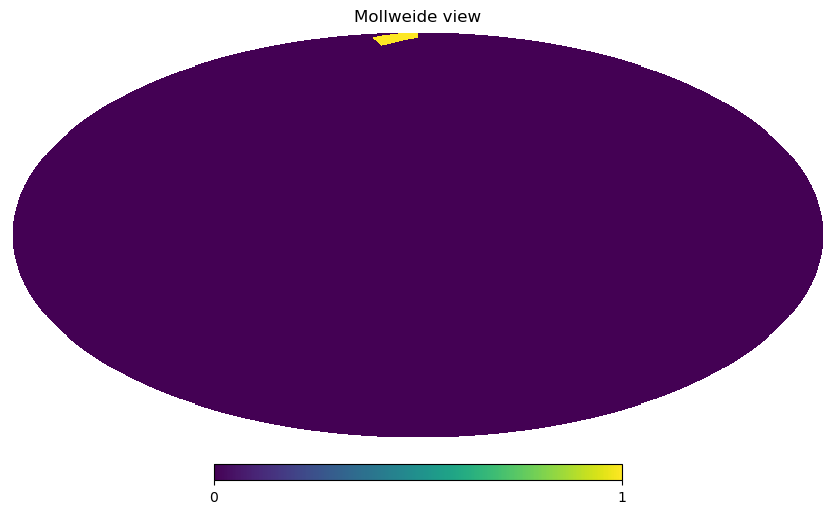

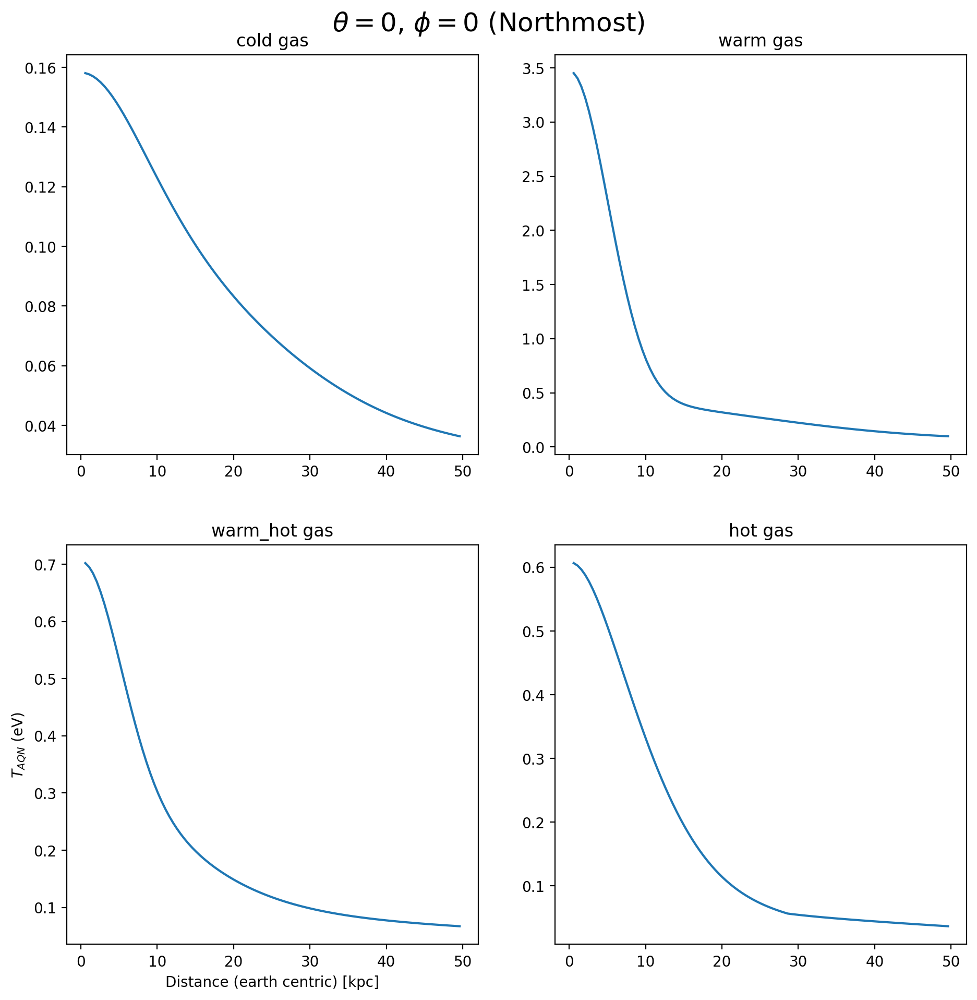

In [136]:
chosen_theta = 0
chosen_phi   = 0

plot_temperature_vs_l(T_aqn_dict_ev, chosen_theta, chosen_phi)



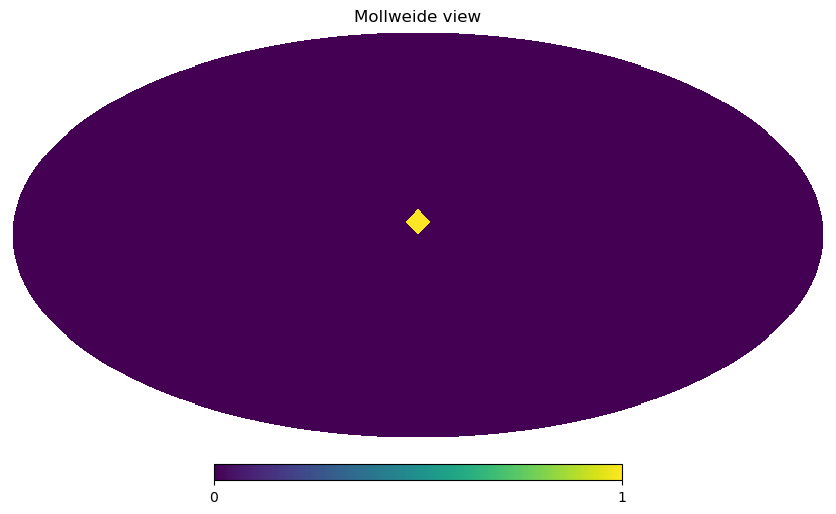

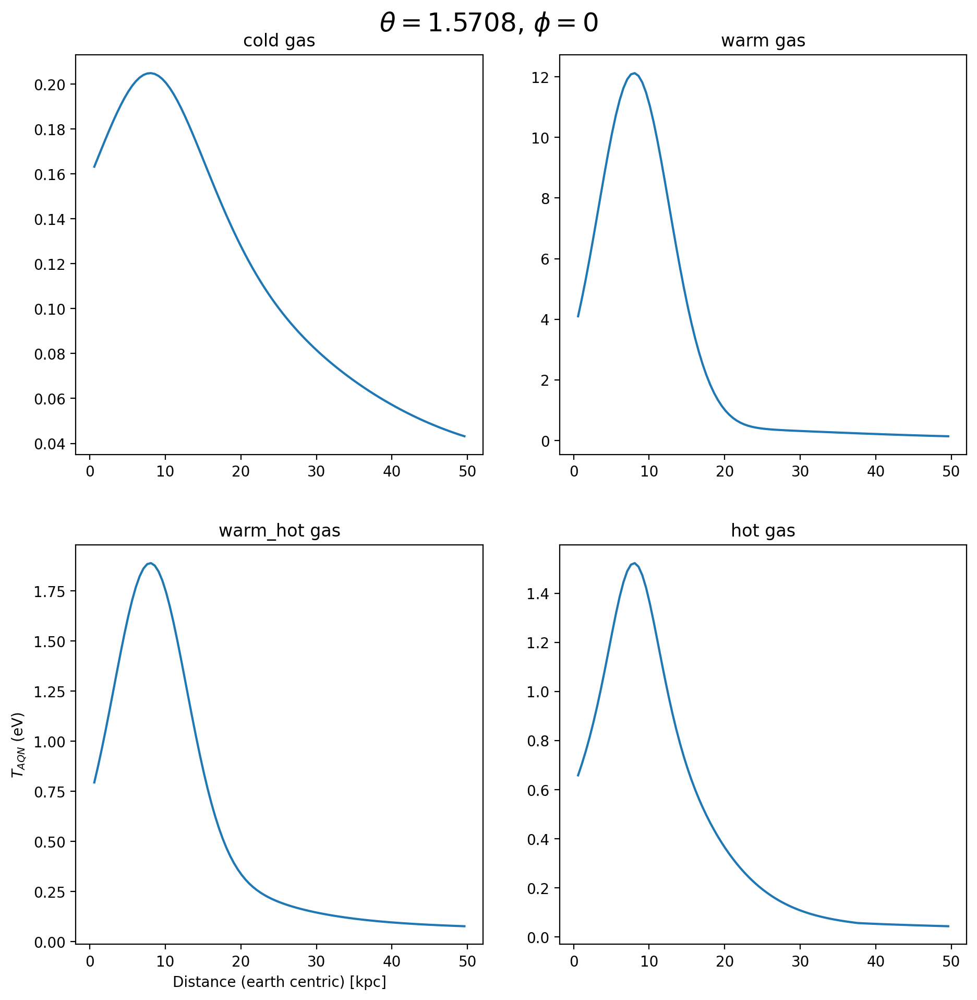

In [142]:
chosen_theta = np.pi/2
chosen_phi   = 0

plot_temperature_vs_l(T_aqn_dict_ev, chosen_theta, chosen_phi)



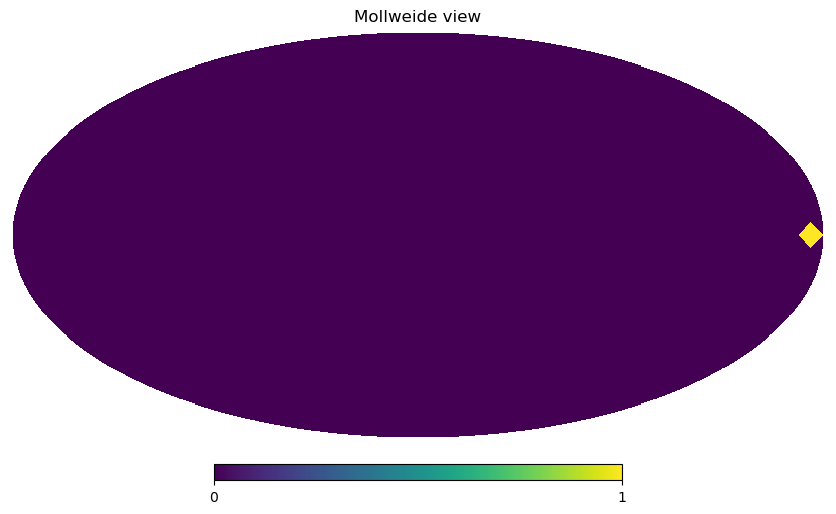

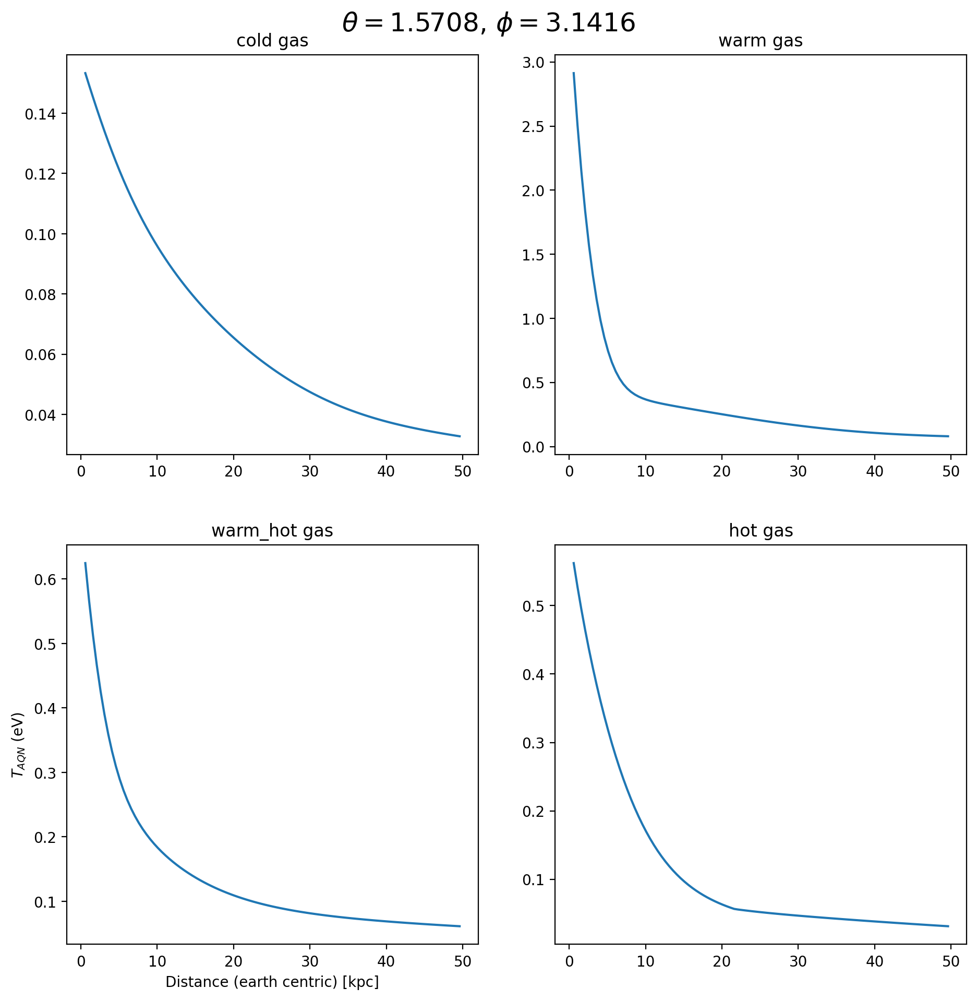

In [144]:
chosen_theta = np.pi/2
chosen_phi   = np.pi

plot_temperature_vs_l(T_aqn_dict_ev, chosen_theta, chosen_phi)



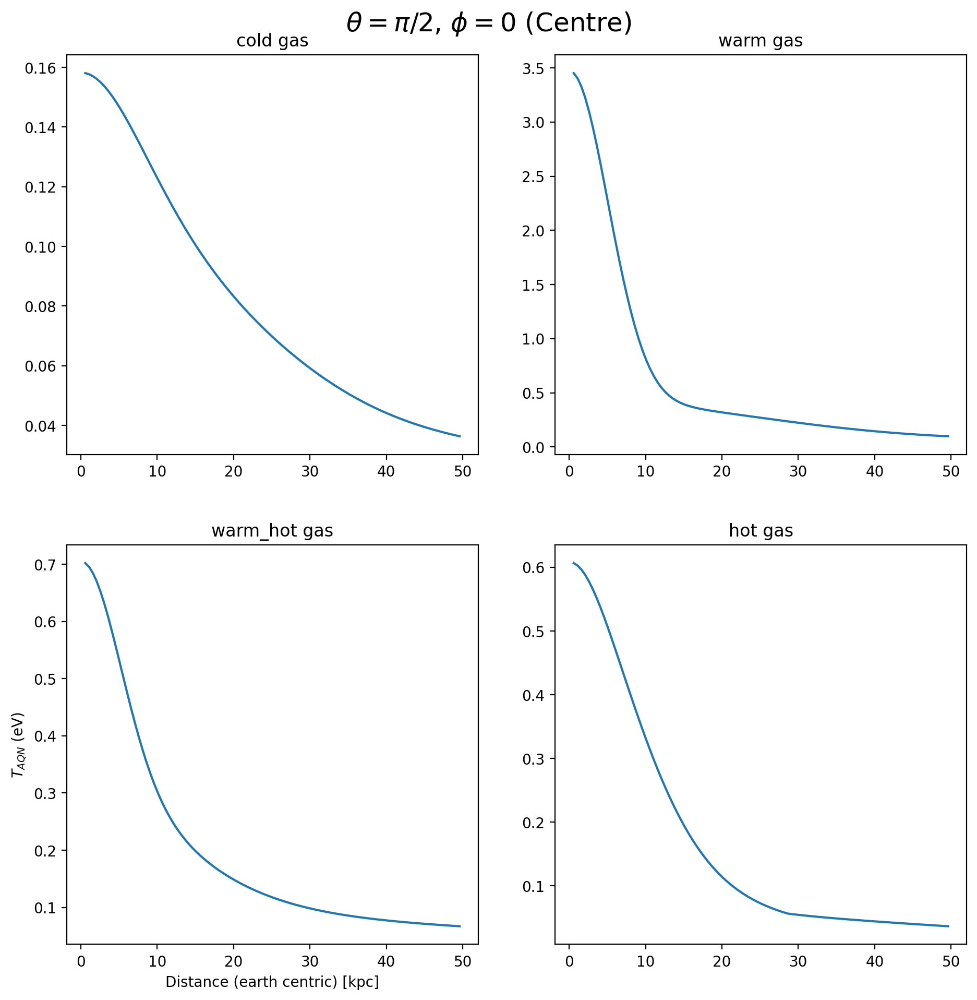

In [127]:
chosen_theta = np.pi
chosen_phi   = 0

# Create a 2x2 grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10), dpi=200)

# Define the titles for each subplot
titles = ['cold', 'warm', 'warm_hot', 'hot']

# Loop through each subplot and add a plot with the given title
for i, ax in enumerate(axes.flat):
    ax.plot(l_array[:,pixel_index], T_aqn_dict_ev[titles[i]][:,pixel_index])
    ax.set_title(titles[i]+" gas")
    #ax.set_xlabel('Distance (earth centric) [kpc]')
    #ax.set_ylabel('$T_{AQN}$ (eV)')
axes[1][0].set_xlabel('Distance (earth centric) [kpc]')
axes[1][0].set_ylabel('$T_{AQN}$ (eV)')
# Adjust the layout and padding of the subplots
fig.tight_layout(pad=3.0)

fig.suptitle(r'$\theta = \pi/2$, $\phi = 0$ (Centre)', fontsize=18)

# Display the figure
plt.show()


In [115]:
len(l_array)

99

In [102]:
def calc_T_aqn(n_AQN, n_bar, Dv, f, g, T_gas, R_AQN, nu):
    T_neu_eV = T_AQN_analytical(n_bar, Dv, f, g)
    T_ion_eV = T_AQN_ionized2(n_bar, Dv, f, g, T_gas, R_AQN)
    T_AQN = T_neu_eV.copy()                   # don't need this, use T_neu_eV
    ion_greater_neu = np.where(T_ion_eV > T_neu_eV)
    T_AQN[ion_greater_neu] = T_ion_eV[ion_greater_neu]
    #dFdw = spectral_surface_emissivity(T_AQN, frequency_band)
    #dF = np.sum(dFdw,2)
    return T_AQN


warm_T_aqn = calc_T_aqn( n_aqn_cm3, n_warm,  Dv, f, g, T_warm,     R_aqn_cm, frequency_band)
warm_hot_T_aqn = calc_T_aqn( n_aqn_cm3, n_warm_hot, Dv, f, g, T_warm_hot, R_aqn_cm, frequency_band)
hot_T_aqn = calc_T_aqn( n_aqn_cm3, n_hot,  Dv, f, g, T_hot,      R_aqn_cm, frequency_band)

<Quantity [10081.15962289,  9506.08046891,  9506.08046891, ...,
            9506.08046891,  9506.08046891, 10081.15962289] cm>

In [ ]:
# pick line of sight away from galactic centre, directly north
# look at T_AQN along this line of sight